In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from utils import *
import pandas as pd
import geopandas as gpd
from shapely import wkt
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial import distance_matrix
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn.functional as F
from torch_geometric.nn import GINConv, global_add_pool
from torch_geometric.utils import from_networkx
from statsmodels.stats.outliers_influence import variance_inflation_factor
import random
import itertools
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
tex_fonts = {
    #source: https://jwalton.info/Embed-Publication-Matplotlib-Latex/
    # Use LaTeX to write all text
    "text.usetex": True,
    "font.family": "serif",
    # Use 10pt font in plots, to match 10pt font in document
    #"axes.labelsize": 10,
    "font.size": 10,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 8,
    "axes.titlesize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    'text.latex.preamble': r"\usepackage{amsmath}"
}
import pandas as pd
import geopandas as gpd
from shapely import wkt

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Display the GeoDataFrame to ensure it's correct
print(gdf.head())

                    LSOA21NM   centroid_x   centroid_y  c_percent asian  \
0        City of London 001A  532151.1942  181615.2014         0.107191   
1        City of London 001B  532443.6860  181645.7249         0.130592   
2        City of London 001C  532207.0148  182030.1296         0.094913   
3        City of London 001E  533618.3485  181157.3543         0.321526   
4  Barking and Dagenham 016A  544934.3697  184297.5465         0.479675   

   c_percent black  c_percent mixed  c_percent white  c_percent sikh  \
0         0.007463         0.037992         0.801221        0.000000   
1         0.007937         0.043290         0.782107        0.000000   
2         0.034739         0.062655         0.741315        0.001860   
3         0.108084         0.071753         0.385104        0.000000   
4         0.108401         0.037940         0.327913        0.036295   

   c_percent hindu  c_percent christian  ...  o_opioids_quantity_per_capita  \
0         0.026441             0.3457

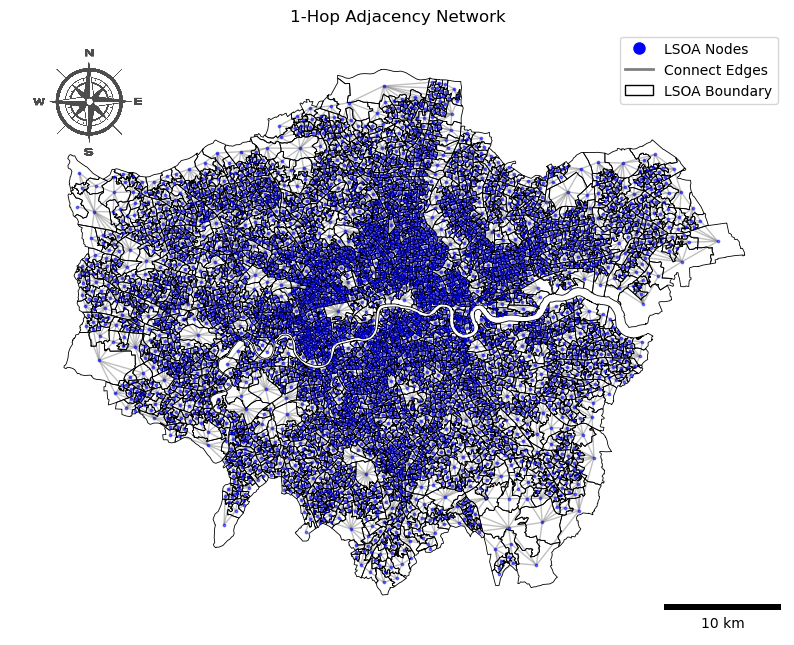

In [2]:
import os
import pandas as pd
import geopandas as gpd
from shapely import wkt
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib_scalebar.scalebar as sb
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')

# 手动处理索引
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
for idx, row in neighbors.iterrows():
    G.add_edge(row.name, row['index_right'], weight=1)

# 可视化邻接关系
fig, ax = plt.subplots(figsize=(10, 10))

# 绘制地理坐标边框，并设置透明度
gdf.boundary.plot(ax=ax, linewidth=0.6, edgecolor='black')

# 绘制节点和边
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, node_size=3, node_color='blue', edge_color='grey', alpha=0.5, ax=ax)

# 添加比例尺
scalebar = sb.ScaleBar(1, location='lower right')
ax.add_artist(scalebar)

# 创建自定义图例
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='LSOA Nodes',
           markerfacecolor='blue', markersize=10),
    Line2D([0], [0], color='grey', lw=2, label='Connect Edges'),
    Patch(facecolor='none', edgecolor='black', label='LSOA Boundary')
]

# 添加图例到图中
ax.legend(handles=legend_elements, loc='upper right')

# 添加指北针
north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
arr_img = plt.imread(north_arrow_path)
imagebox = OffsetImage(arr_img, zoom=0.08, alpha=0.7)  # 调整缩放比例
ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
ax.add_artist(ab)


plt.title("1-Hop Adjacency Network")

# 确保目标文件夹存在
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# 保存图片到目标文件夹
output_path = os.path.join(output_folder, '1-Hop Adjacency Network.png')
plt.savefig(output_path)

plt.show()

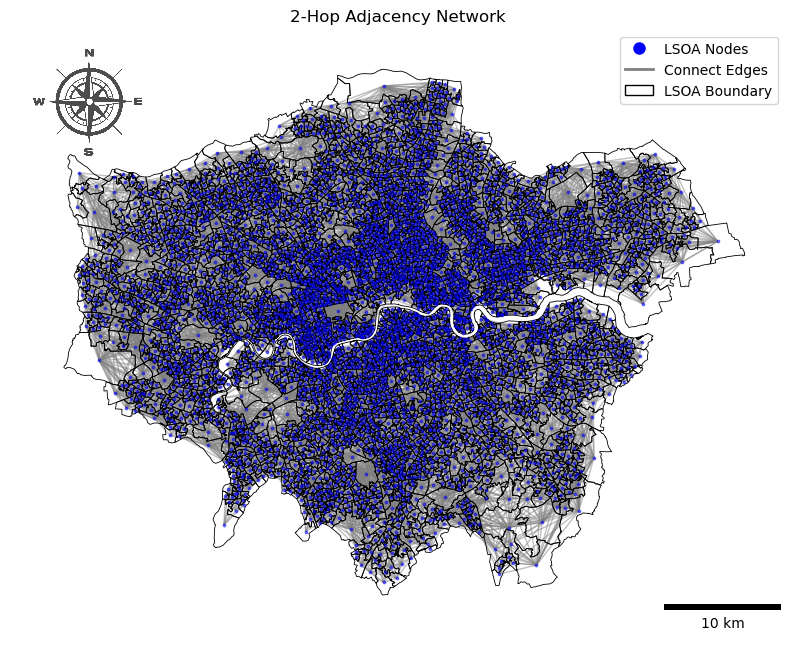

In [23]:
import os
import pandas as pd
import geopandas as gpd
from shapely import wkt
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib_scalebar.scalebar as sb
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 提取几何中心点的坐标
coords = np.array(list(zip(gdf.geo_centroid.x, gdf.geo_centroid.y)))

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 创建邻居关系字典
first_level_neighbors = {i: [] for i in range(len(gdf))}
second_level_neighbors = {i: set() for i in range(len(gdf))}

for idx, row in neighbors.iterrows():
    first_level_neighbors[row.name].append(row['index_right'])

# 查找第二层邻居
for i in first_level_neighbors:
    for first_neighbor in first_level_neighbors[i]:
        second_level_neighbors[i].update(first_level_neighbors[first_neighbor])
    second_level_neighbors[i].discard(i)
    second_level_neighbors[i].difference_update(first_level_neighbors[i])

# 构建网络，不区分边的层级，统一绘制
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加所有边，不区分一级和二级
for idx, neighbors in first_level_neighbors.items():
    for neighbor in neighbors:
        G.add_edge(idx, neighbor, weight=1)

for idx, neighbors in second_level_neighbors.items():
    for neighbor in neighbors:
        G.add_edge(idx, neighbor, weight=1)

# 可视化邻接关系
fig, ax = plt.subplots(figsize=(10, 10))

# 绘制地理坐标边框，并设置透明度
gdf.boundary.plot(ax=ax, linewidth=0.6, edgecolor='black')

# 绘制节点和边，不区分一级和二级
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, node_size=3, node_color='blue', edge_color='grey', alpha=0.5, ax=ax)

# 添加比例尺
scalebar = sb.ScaleBar(1, location='lower right')
ax.add_artist(scalebar)

# 创建自定义图例，风格与1-Hop一致
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='LSOA Nodes',
           markerfacecolor='blue', markersize=10),
    Line2D([0], [0], color='grey', lw=2, label='Connect Edges'),
    Patch(facecolor='none', edgecolor='black', label='LSOA Boundary')
]

# 添加图例到图中
ax.legend(handles=legend_elements, loc='upper right')

# 添加指北针
north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
arr_img = plt.imread(north_arrow_path)
imagebox = OffsetImage(arr_img, zoom=0.08, alpha=0.7)  # 调整缩放比例
ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
ax.add_artist(ab)

plt.title("2-Hop Adjacency Network")

# 确保目标文件夹存在
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# 保存图片到目标文件夹
output_path = os.path.join(output_folder, '2-Hop Adjacency Network.png')
plt.savefig(output_path)

plt.show()

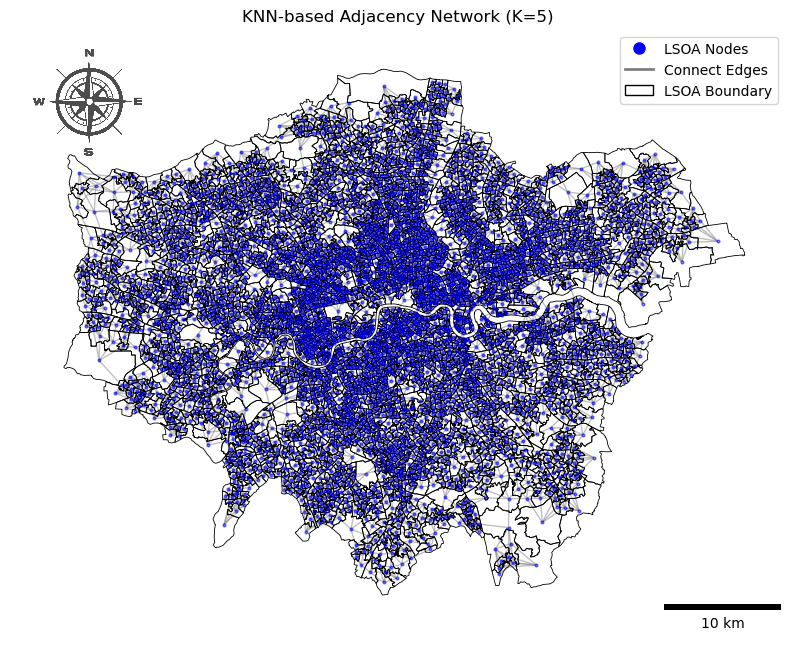

In [12]:
import os
import pandas as pd
import geopandas as gpd
from shapely import wkt
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib_scalebar.scalebar as sb
from sklearn.neighbors import NearestNeighbors
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 提取几何中心点的坐标
coords = list(zip(gdf.geo_centroid.x, gdf.geo_centroid.y))

# 使用KNN算法构建K=3的邻近网络
nbrs = NearestNeighbors(n_neighbors=6, algorithm='ball_tree').fit(coords)  # 设置为4，因为包括节点自身
distances, indices = nbrs.kneighbors(coords)

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据KNN邻近关系
for i, neighbors in enumerate(indices):
    for neighbor in neighbors[1:]:  # 跳过第一个邻居（即节点自身）
        G.add_edge(i, neighbor, weight=1)

# 可视化邻接关系
fig, ax = plt.subplots(figsize=(10, 10))

# 绘制地理坐标边框，并设置透明度
gdf.boundary.plot(ax=ax, linewidth=0.6, edgecolor='black')

# 绘制节点和边
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, node_size=4, node_color='blue', edge_color='grey', alpha=0.5, ax=ax)

# 添加比例尺
scalebar = sb.ScaleBar(1, location='lower right')
ax.add_artist(scalebar)

# 创建自定义图例
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='LSOA Nodes',
           markerfacecolor='blue', markersize=10),
    Line2D([0], [0], color='grey', lw=2, label='Connect Edges'),
    Patch(facecolor='none', edgecolor='black', label='LSOA Boundary')
]

# 添加图例到图中
ax.legend(handles=legend_elements, loc='upper right')

# 添加指北针
north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
arr_img = plt.imread(north_arrow_path)
imagebox = OffsetImage(arr_img, zoom=0.08, alpha=0.7)  # 调整缩放比例
ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
ax.add_artist(ab)

plt.title("KNN-based Adjacency Network (K=5)")

# 确保目标文件夹存在
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# 保存图片到目标文件夹
output_path = os.path.join(output_folder, 'KNN-based Adjacency Network K=5 with North Arrow.png')
plt.savefig(output_path)

plt.show()


In [3]:
# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 固定选取的变量
fixed_columns = [
    'c_percent Aged 10 to 14 years', 'c_percent Aged 15 to 19 years', 'c_percent male',
       'c_percent Aged 20 to 24 years', 'c_percent Aged 25 to 29 years',
       'c_percent Aged 30 to 34 years', 'c_percent Aged 35 to 39 years',
       'c_percent Aged 40 to 44 years', 'c_percent Aged 45 to 49 years',
        'c_percent Aged 50 to 54 years', 'c_percent Aged 55 to 59 years',
        'c_percent Aged 60 to 64 years', 'c_percent Aged 65 to 69 years',
       'c_percent Aged 70 to 74 years', 'c_percent Aged 75 to 79 years',
       'c_percent Aged 80 to 84 years', 'c_percent Aged 85 years and over',
       'c_percent mixed', 'c_percent white',
       'c_percent 2. Professional occupations', 'c_pop_density', 'e_NO2',
       'e_ndvi', 'e_water', 'e_trees', 'e_grass', 'e_bare', 'c_percent asian',
       'c_percent black', 'c_percent buddhist', 'c_percent muslim',
       'c_percent no central heating', 'c_percent communal heating',
       'c_percent TFW less than 2km', 'c_percent 49 or more hours worked',
       'c_percent commute on foot', 'c_percent commute metro rail',
       'c_percent commute bus', 'c_percent commute bicycle',
       'c_percent student moved to address',
       'c_percent occupancy rating bedrooms -2',
       'c_percent occupancy rating bedrooms -1', 'c_percent 10 years or more',
       'c_percent 2 years or more but less than 5 years',
       'c_percent 5 years or more but less than 10 years',
       # 'c_percent married or in a registered civil partnership married same sex',
       'c_percent married or in a registered civil partnership in a registered civil partnership',
       'c_percent separated but still legally married or still legally in a civil partnership separated but still in a registered civil partnership',
       'c_percent divorced or civil partnership dissolved formerly in a civil partnership now legally dissolved',
       'c_percent   cannot speak english well',
       'c_percent   cannot speak english',
       'c_percent households deprived in four dimensions',
       'c_percent christian', 'c_percent WFH', 'c_percent part-time',
       'c_percent commute train', 'c_percent outside UK moved to address',
       'c_percent occupancy rating bedrooms +2',
       'c_percent 3. Associate professional and technical occupations',
       'c_percent 5. Skilled trades occupations',
       'c_percent 6. Caring leisure and other service occupations',
       'c_percent divorced or civil partnership dissolved',
       'e_lake_mix_layer_depth', 'e_snow_cover', 'e_surface_runoff_sum',
       'e_snow_and_ice', 'e_crops', 'e_evaporation_from_the_top_of_canopy_sum',
       'e_shrub_and_scrub'
]

# 提取固定变量
fixed_features = gdf[fixed_columns].apply(pd.to_numeric, errors='coerce')

# 使用邻接节点的均值填充空值
for i, row in fixed_features.iterrows():
    for col in fixed_columns:
        if pd.isna(row[col]):
            neighbor_indices = list(G.neighbors(i))
            if neighbor_indices:  # 确保有邻居
                neighbor_values = fixed_features.iloc[neighbor_indices][col]
                mean_value = neighbor_values.mean()
                if pd.isna(mean_value):
                    mean_value = fixed_features[col].mean()  # 如果邻居的均值还是nan，使用全局均值填充
                fixed_features.at[i, col] = mean_value
            else:
                fixed_features.at[i, col] = fixed_features[col].mean()  # 如果没有邻居，使用全局均值填充

# 再次检查是否有任何nan值
print("Remaining NaN count:", fixed_features.isna().sum().sum())

# 计算VIF
def calculate_vif(df):
    vif = pd.DataFrame()
    vif["Variable"] = df.columns
    vif["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif
# 设置显示所有行和列
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
vif_df = calculate_vif(fixed_features)
print(vif_df) 

# 进行标准化
scaler = StandardScaler()
final_features_scaled = scaler.fit_transform(fixed_features)
final_features_tensor = torch.tensor(final_features_scaled, dtype=torch.float)

# 准备目标变量
# target_column = 'o_diabetes_quantity_per_capita'
# target_column = 'o_hypertension_quantity_per_capita'
target_column = 'o_asthma_quantity_per_capita'
# target_column = 'o_depression_quantity_per_capita'
# target_column = 'o_anxiety_quantity_per_capita'
# target_column = 'o_opioids_quantity_per_capita'
# target_column = 'o_total_quantity_per_capita'

target = gdf[target_column].apply(pd.to_numeric, errors='coerce').fillna(0)
targets = torch.tensor(target.values, dtype=torch.float).unsqueeze(1)  # 添加维度以匹配模型输出

# 将 NetworkX 图转换为 PyTorch Geometric 数据
from torch_geometric.utils import from_networkx
data = from_networkx(G)
data.x = final_features_tensor
data.y = targets

Remaining NaN count: 0
                                             Variable          VIF
0                       c_percent Aged 10 to 14 years    65.022725
1                       c_percent Aged 15 to 19 years    25.147244
2                                      c_percent male   830.854278
3                       c_percent Aged 20 to 24 years    44.665864
4                       c_percent Aged 25 to 29 years    56.721904
5                       c_percent Aged 30 to 34 years    82.438519
6                       c_percent Aged 35 to 39 years   102.994696
7                       c_percent Aged 40 to 44 years    90.654342
8                       c_percent Aged 45 to 49 years    69.255456
9                       c_percent Aged 50 to 54 years    59.190730
10                      c_percent Aged 55 to 59 years    54.518945
11                      c_percent Aged 60 to 64 years    45.775759
12                      c_percent Aged 65 to 69 years    38.938518
13                      c_percent Aged 

In [11]:
data

Data(edge_index=[2, 29472], pos=[4994, 2], weight=[29472], x=[4994, 64], y=[4994, 1])

Running configuration 1/50: {'lr': 0.001, 'weight_decay': 0.001, 'hidden1': 32, 'hidden2': 32, 'dropout': 0.3, 'num_epochs': 200}
Configuration 1/50 finished with final loss: 3.9380
Running configuration 2/50: {'lr': 0.001, 'weight_decay': 0.001, 'hidden1': 32, 'hidden2': 64, 'dropout': 0.7, 'num_epochs': 200}
Configuration 2/50 finished with final loss: 4.9848
Running configuration 3/50: {'lr': 0.001, 'weight_decay': 0.001, 'hidden1': 32, 'hidden2': 64, 'dropout': 0.3, 'num_epochs': 200}
Configuration 3/50 finished with final loss: 2.6848
Running configuration 4/50: {'lr': 0.01, 'weight_decay': 0.005, 'hidden1': 128, 'hidden2': 32, 'dropout': 0.7, 'num_epochs': 200}
Configuration 4/50 finished with final loss: 3.6658
Running configuration 5/50: {'lr': 0.01, 'weight_decay': 0.005, 'hidden1': 128, 'hidden2': 16, 'dropout': 0.7, 'num_epochs': 200}
Configuration 5/50 finished with final loss: 5.5234
Running configuration 6/50: {'lr': 0.01, 'weight_decay': 0.0005, 'hidden1': 32, 'hidden2':

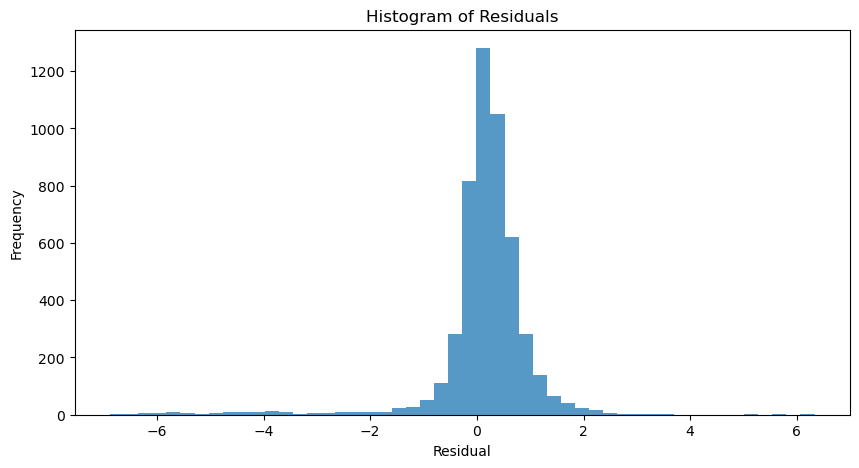

In [5]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import random
import itertools
import matplotlib.pyplot as plt

class GATv2_TwoLayer(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2_TwoLayer, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

# 定义超参数空间
param_space = {
    'lr': [0.001, 0.005, 0.01],
    'weight_decay': [5e-4, 1e-3, 5e-3],
    'hidden1': [32, 64, 128],
    'hidden2': [16, 32, 64],
    'dropout': [0.3, 0.5, 0.7],
    'num_epochs': [200]
}

# 随机搜索
num_samples = 50  # 选择搜索的参数组合数量
random_params = [dict(zip(param_space, v)) for v in random.sample(list(itertools.product(*param_space.values())), num_samples)]

best_loss = float('inf')
best_params = None

for i, params in enumerate(random_params):
    print(f"Running configuration {i + 1}/{num_samples}: {params}")
    
    model = GATv2_TwoLayer(
        in_channels=data.x.shape[1], 
        hidden1=params['hidden1'], 
        hidden2=params['hidden2'], 
        out_channels=data.y.shape[1], 
        dropout=params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=params['lr'], weight_decay=params['weight_decay'])

    losses = []
    for epoch in range(params['num_epochs']):
        loss = train(model, optimizer, data)
        losses.append(loss)

    print(f"Configuration {i + 1}/{num_samples} finished with final loss: {losses[-1]:.4f}")

    if losses[-1] < best_loss:
        best_loss = losses[-1]
        best_params = params

print(f'Best params: {best_params}, Best loss: {best_loss:.4f}')

# 使用最佳超参数重新训练模型
model = GATv2_TwoLayer(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=data.y.shape[1], 
    dropout=best_params['dropout']
)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

losses = []
for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    pred = model(data)
    residuals = data.y - pred

# 计算评估指标
y_true = data.y.detach().numpy()
y_pred = pred.detach().numpy()

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')
print(f'MAE: {mae:.4f}')
print(f'R²: {r2:.4f}')

# 可视化残差
plt.figure(figsize=(10, 5))
plt.hist(residuals.detach().numpy(), bins=50, alpha=0.75)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

In [45]:
best_params_Depression = {'lr': 0.01,
 'weight_decay': 0.005,
 'hidden1': 128,
 'hidden2': 64,
 'dropout': 0.3,
 'num_epochs': 200}

best_params_Diabetes = {'lr': 0.005,
 'weight_decay': 0.001,
 'hidden1': 128,
 'hidden2': 64,
 'dropout': 0.3,
 'num_epochs': 200}

best_params_Hypertension = {'lr': 0.01, 'weight_decay': 0.001, 'hidden1': 128, 'hidden2': 64, 'dropout': 0.3, 'num_epochs': 200}

best_params_Asthma = {'lr': 0.01, 'weight_decay': 0.005, 'hidden1': 64, 'hidden2': 64, 'dropout': 0.3, 'num_epochs': 200}

best_params_Anxiety = {'lr': 0.005, 'weight_decay': 0.005, 'hidden1': 128, 'hidden2': 32, 'dropout': 0.3, 'num_epochs': 200}

best_params_Opioids = {'lr': 0.01, 'weight_decay': 0.0005, 'hidden1': 128, 'hidden2': 32, 'dropout': 0.3, 'num_epochs': 200}

best_params_Total = {'lr': 0.01, 'weight_decay': 0.005, 'hidden1': 128, 'hidden2': 64, 'dropout': 0.3, 'num_epochs': 200}

In [4]:
best_params = {'lr': 0.01, 'weight_decay': 0.005, 'hidden1': 64, 'hidden2': 64, 'dropout': 0.3, 'num_epochs': 200}

MSE: 8.6449
RMSE: 2.9402
MAE: 2.0815
R²: 0.8963


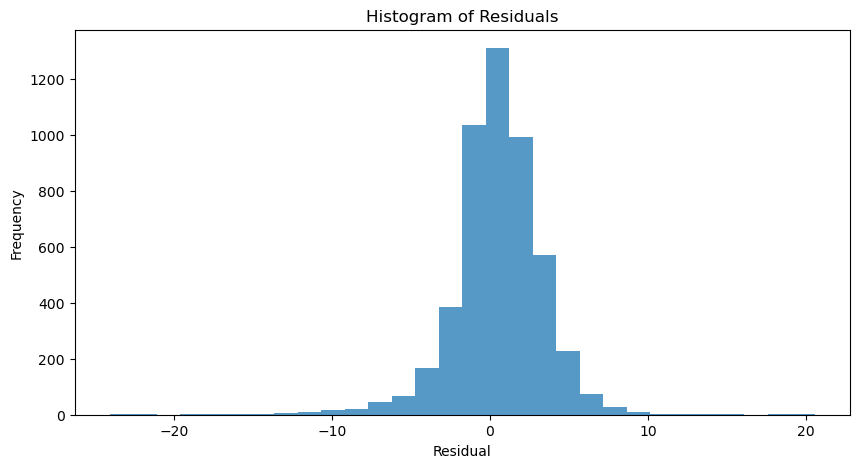

In [14]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import random
import itertools
import matplotlib.pyplot as plt
# 使用最佳超参数重新训练模型

class GATv2_TwoLayer(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2_TwoLayer, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x


# class GATv2_ThreeLayer(torch.nn.Module):
#     def __init__(self, in_channels, hidden1, hidden2, hidden3, out_channels, dropout):
#         super(GATv2_ThreeLayer, self).__init__()
#         self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
#         self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
#         self.conv3 = GATv2Conv(hidden2, hidden3, heads=1)
#         self.fc1 = torch.nn.Linear(hidden3, out_channels)
#         self.dropout = dropout

#     def forward(self, data):
#         x, edge_index = data.x, data.edge_index
#         x = self.conv1(x, edge_index)
#         x = F.relu(x)
#         x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
#         x = self.conv2(x, edge_index)
#         x = F.relu(x)
#         x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
#         x = self.conv3(x, edge_index)
#         x = F.relu(x)
#         x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
#         x = self.fc1(x)
#         return x

# class GATv2_OneLayer(torch.nn.Module):
#     def __init__(self, in_channels, hidden, out_channels, dropout):
#         super(GATv2_OneLayer, self).__init__()
#         self.conv1 = GATv2Conv(in_channels, hidden, heads=1)
#         self.fc1 = torch.nn.Linear(hidden, out_channels)
#         self.dropout = dropout

#     def forward(self, data):
#         x, edge_index = data.x, data.edge_index
#         x = self.conv1(x, edge_index)
#         x = F.relu(x)
#         x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
#         x = self.fc1(x)
#         return x
        
def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()
model = GATv2_TwoLayer(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=data.y.shape[1], 
    dropout=best_params['dropout']
)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

losses = []
for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    pred = model(data)
    residuals = data.y - pred

# 计算评估指标
y_true = data.y.detach().numpy()
y_pred = pred.detach().numpy()

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')
print(f'MAE: {mae:.4f}')
print(f'R²: {r2:.4f}')

# 可视化残差
plt.figure(figsize=(10, 5))
plt.hist(residuals.detach().numpy(), bins=50, alpha=0.75)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

In [5]:
import random
import networkx as nx
import numpy as np
import torch
from torch_geometric.data import Data
from sklearn.metrics import mean_squared_error

def random_walk(G, start_node, walk_length):
    path = [start_node]
    current_node = start_node
    for _ in range(walk_length - 1):
        neighbors = list(G.neighbors(current_node))
        if not neighbors:
            break
        current_node = random.choice(neighbors)
        path.append(current_node)
    return path

def get_path_features(G, path):
    # 计算路径上的平均度数
    degrees = np.mean([G.degree(node) for node in path])
    return np.array([degrees])

def evaluate_model_with_walk_length(G, data, walk_length):
    additional_features = []
    for node in G.nodes():
        path = random_walk(G, node, walk_length)
        path_features = get_path_features(G, path)
        additional_features.append(path_features)

    additional_features = torch.tensor(additional_features, dtype=torch.float)
    data.x = torch.cat((data.x, additional_features), dim=1)

    # 简单的线性回归模型示例
    model = torch.nn.Linear(data.x.shape[1], data.y.shape[1])
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

    # 训练模型
    model.train()
    for epoch in range(100):
        optimizer.zero_grad()
        out = model(data.x)
        loss = torch.nn.functional.mse_loss(out, data.y)
        loss.backward()
        optimizer.step()

    # 评估模型
    model.eval()
    with torch.no_grad():
        pred = model(data.x)
    mse = mean_squared_error(data.y.numpy(), pred.numpy())
    
    # 移除附加的特征，以便在下次迭代时不影响结果
    data.x = data.x[:, :-1]
    
    return mse

# 实验不同的游走长度
walk_lengths = [10, 15, 20, 25, 30, 35, 40]
results = {}
for walk_length in walk_lengths:
    mse = evaluate_model_with_walk_length(G, data, walk_length)
    results[walk_length] = mse
    print(f'Walk length: {walk_length}, MSE: {mse:.4f}')

# 选择最佳游走长度
best_walk_length = min(results, key=results.get)
print(f'Best walk length: {best_walk_length}, MSE: {results[best_walk_length]:.4f}')

# 计算并加入最优游走长度下的附加特征
additional_features = []
for node in G.nodes():
    path = random_walk(G, node, best_walk_length)
    path_features = get_path_features(G, path)
    additional_features.append(path_features)

additional_features = torch.tensor(additional_features, dtype=torch.float)
data.x = torch.cat((data.x, additional_features), dim=1)

# 返回最终数据集
data


C:\Users\0\AppData\Local\Temp\ipykernel_24772\2229101450.py:31: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:277.)
  additional_features = torch.tensor(additional_features, dtype=torch.float)


Walk length: 10, MSE: 10.9358
Walk length: 15, MSE: 12.1454
Walk length: 20, MSE: 11.0646
Walk length: 25, MSE: 10.3864
Walk length: 30, MSE: 12.5903
Walk length: 35, MSE: 11.2481
Walk length: 40, MSE: 10.4197
Best walk length: 25, MSE: 10.3864


Data(edge_index=[2, 29472], pos=[4994, 2], weight=[29472], x=[4994, 69], y=[4994, 1])

In [5]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.model_selection import KFold
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import itertools
import random

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义划分子图的函数
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 超参数搜索函数
def hyperparameter_search(data, param_space, k=3, num_hops=1, num_samples=20):
    best_loss = float('inf')
    best_params = None
    random_params = [dict(zip(param_space, v)) for v in random.sample(list(itertools.product(*param_space.values())), num_samples)]
    
    for param_idx, params in enumerate(random_params):
        print(f'Starting hyperparameter set {param_idx + 1}/{num_samples}: {params}')
        kf = KFold(n_splits=k, shuffle=True, random_state=42)
        fold_losses = []
        
        for fold, (train_idx, test_idx) in enumerate(kf.split(np.arange(data.num_nodes))):
            print(f'Starting fold {fold + 1}/{k} for hyperparameter set {param_idx + 1}/{num_samples}')
            (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
            
            # 重新初始化模型和优化器
            model = GATv2(
                in_channels=train_x.shape[1], 
                hidden1=params['hidden1'], 
                hidden2=params['hidden2'], 
                out_channels=train_y.shape[1], 
                dropout=params['dropout']
            )
            optimizer = torch.optim.Adam(model.parameters(), lr=params['lr'], weight_decay=params['weight_decay'])
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
            early_stopping = EarlyStopping(patience=10)
            
            # 训练模型
            for epoch in range(params['num_epochs']):
                loss = train(model, optimizer, data)
                val_loss = evaluate(model, data)
                scheduler.step(val_loss)
                
                if (epoch + 1) % 10 == 0:
                    print(f'Hyperparameter set {param_idx + 1}/{num_samples}, Fold {fold + 1}/{k}, Epoch {epoch + 1}/{params["num_epochs"]}, Loss: {loss:.4f}, Val Loss: {val_loss:.4f}')
                
                if early_stopping.step(val_loss):
                    print(f'Early stopping at epoch {epoch + 1}')
                    break
            
            # 测试模型
            model.eval()
            with torch.no_grad():
                pred = model(test_x, test_edge_index)
                fold_loss = F.mse_loss(pred, test_y).item()
                fold_losses.append(fold_loss)
        
        avg_fold_loss = np.mean(fold_losses)
        print(f'Average loss for hyperparameter set {param_idx + 1}/{num_samples}: {avg_fold_loss:.4f}')
        if avg_fold_loss < best_loss:
            best_loss = avg_fold_loss
            best_params = params
    
    return best_params, best_loss

# 定义K-Fold交叉验证
def k_fold_cross_validation(data, best_params, k=3, num_hops=1):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    results = []

    all_indices = np.arange(data.num_nodes)
    
    for fold, (train_idx, test_idx) in enumerate(kf.split(all_indices)):
        print(f'Starting fold {fold + 1}/{k}')
        (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
        
        # 重新初始化模型和优化器
        model = GATv2(
            in_channels=train_x.shape[1], 
            hidden1=best_params['hidden1'], 
            hidden2=best_params['hidden2'], 
            out_channels=train_y.shape[1], 
            dropout=best_params['dropout']
        )
        optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
        early_stopping = EarlyStopping(patience=10)
        
        # 训练模型
        model.train()
        for epoch in range(best_params['num_epochs']):
            loss = train(model, optimizer, data)
            val_loss = evaluate(model, data)
            scheduler.step(val_loss)
            
            if (epoch + 1) % 10 == 0:
                print(f'Fold {fold + 1}/{k}, Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}, Val Loss: {val_loss:.4f}')
            
            if early_stopping.step(val_loss):
                print(f'Early stopping at epoch {epoch + 1}')
                break
        
        # 测试模型
        model.eval()
        with torch.no_grad():
            pred = model(test_x, test_edge_index)
            y_true = test_y.numpy()
            y_pred = pred.numpy()
            
            mse = mean_squared_error(y_true, y_pred)
            rmse = np.sqrt(mse)
            mae = mean_absolute_error(y_true, y_pred)
            r2 = r2_score(y_true, y_pred)
        
        print(f'Fold {fold + 1} results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
        results.append((mse, rmse, mae, r2))
    
    return results

# 假设你已经有一个数据对象 data
# data = ...

# 定义超参数空间
param_space = {
    'lr': [0.001, 0.005, 0.01],
    'weight_decay': [5e-4, 1e-3, 5e-3],
    'hidden1': [32, 64, 128],
    'hidden2': [16, 32, 64],
    'dropout': [0.3, 0.5, 0.7],
    'num_epochs': [200]
}

# 使用K-Fold交叉验证进行超参数搜索
best_params, best_loss = hyperparameter_search(data, param_space)
print(f'Best params: {best_params}, Best loss: {best_loss:.4f}')

# 使用最佳超参数进行K-Fold交叉验证
results = k_fold_cross_validation(data, best_params)

# 打印K-Fold结果
for fold, (mse, rmse, mae, r2) in enumerate(results):
    print(f'Fold {fold + 1} - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')

# 计算平均结果
avg_results = np.mean(results, axis=0)
print(f'Average - MSE: {avg_results[0]:.4f}, RMSE: {avg_results[1]:.4f}, MAE: {avg_results[2]:.4f}, R²: {avg_results[3]:.4f}')


Starting hyperparameter set 1/20: {'lr': 0.005, 'weight_decay': 0.005, 'hidden1': 128, 'hidden2': 32, 'dropout': 0.3, 'num_epochs': 200}
Starting fold 1/3 for hyperparameter set 1/20


C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Hyperparameter set 1/20, Fold 1/3, Epoch 10/200, Loss: 622.9653, Val Loss: 562.6119
Hyperparameter set 1/20, Fold 1/3, Epoch 20/200, Loss: 577.5788, Val Loss: 526.7006
Hyperparameter set 1/20, Fold 1/3, Epoch 30/200, Loss: 527.1722, Val Loss: 500.7806
Hyperparameter set 1/20, Fold 1/3, Epoch 40/200, Loss: 470.5626, Val Loss: 444.7780
Hyperparameter set 1/20, Fold 1/3, Epoch 50/200, Loss: 406.5591, Val Loss: 370.6872
Hyperparameter set 1/20, Fold 1/3, Epoch 60/200, Loss: 337.5511, Val Loss: 293.1253
Hyperparameter set 1/20, Fold 1/3, Epoch 70/200, Loss: 268.0017, Val Loss: 241.0088
Hyperparameter set 1/20, Fold 1/3, Epoch 80/200, Loss: 210.3824, Val Loss: 183.3189
Hyperparameter set 1/20, Fold 1/3, Epoch 90/200, Loss: 157.5939, Val Loss: 140.7659
Hyperparameter set 1/20, Fold 1/3, Epoch 100/200, Loss: 119.0626, Val Loss: 110.3455
Hyperparameter set 1/20, Fold 1/3, Epoch 110/200, Loss: 92.1074, Val Loss: 84.0497
Hyperparameter set 1/20, Fold 1/3, Epoch 120/200, Loss: 75.5907, Val Loss: 6

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 2/3, Epoch 10/200, Loss: 615.5670, Val Loss: 583.8979
Fold 2/3, Epoch 20/200, Loss: 567.9489, Val Loss: 533.7714
Fold 2/3, Epoch 30/200, Loss: 515.3704, Val Loss: 480.4523
Fold 2/3, Epoch 40/200, Loss: 453.6778, Val Loss: 411.4003
Fold 2/3, Epoch 50/200, Loss: 386.6468, Val Loss: 356.9490
Fold 2/3, Epoch 60/200, Loss: 319.5128, Val Loss: 303.7495
Fold 2/3, Epoch 70/200, Loss: 257.5439, Val Loss: 246.4547
Fold 2/3, Epoch 80/200, Loss: 193.4687, Val Loss: 189.3384
Fold 2/3, Epoch 90/200, Loss: 143.9469, Val Loss: 141.9044
Fold 2/3, Epoch 100/200, Loss: 104.3240, Val Loss: 96.1579
Fold 2/3, Epoch 110/200, Loss: 76.6428, Val Loss: 68.2420
Fold 2/3, Epoch 120/200, Loss: 62.2842, Val Loss: 58.2699
Fold 2/3, Epoch 130/200, Loss: 53.9979, Val Loss: 46.8723
Fold 2/3, Epoch 140/200, Loss: 48.9314, Val Loss: 37.8330
Fold 2/3, Epoch 150/200, Loss: 45.6925, Val Loss: 35.1157
Fold 2/3, Epoch 160/200, Loss: 43.6617, Val Loss: 30.7460
Fold 2/3, Epoch 170/200, Loss: 40.8808, Val Loss: 28.3885
Fold

C:\Users\0\anaconda3\envs\envGEOG0051\Lib\site-packages\torch\optim\lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Fold 3/3, Epoch 10/200, Loss: 629.2394, Val Loss: 594.3724
Fold 3/3, Epoch 20/200, Loss: 589.6800, Val Loss: 566.0198
Fold 3/3, Epoch 30/200, Loss: 549.4581, Val Loss: 526.3649
Fold 3/3, Epoch 40/200, Loss: 498.4494, Val Loss: 465.3982
Fold 3/3, Epoch 50/200, Loss: 437.4304, Val Loss: 408.5596
Fold 3/3, Epoch 60/200, Loss: 369.6184, Val Loss: 359.1738
Fold 3/3, Epoch 70/200, Loss: 300.3064, Val Loss: 286.1588
Fold 3/3, Epoch 80/200, Loss: 231.3708, Val Loss: 227.5481
Fold 3/3, Epoch 90/200, Loss: 170.9635, Val Loss: 168.8500
Fold 3/3, Epoch 100/200, Loss: 125.4943, Val Loss: 122.3859
Fold 3/3, Epoch 110/200, Loss: 92.0210, Val Loss: 84.6982
Fold 3/3, Epoch 120/200, Loss: 71.2508, Val Loss: 62.8026
Fold 3/3, Epoch 130/200, Loss: 58.4698, Val Loss: 46.8762
Fold 3/3, Epoch 140/200, Loss: 49.7720, Val Loss: 39.6066
Fold 3/3, Epoch 150/200, Loss: 47.2388, Val Loss: 36.6616
Fold 3/3, Epoch 160/200, Loss: 44.2319, Val Loss: 34.5179
Fold 3/3, Epoch 170/200, Loss: 41.6904, Val Loss: 28.4884
Fol

In [8]:
best_params

{'lr': 0.01,
 'weight_decay': 0.005,
 'hidden1': 128,
 'hidden2': 64,
 'dropout': 0.3,
 'num_epochs': 200}

In [9]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.model_selection import KFold
import numpy as np
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.model_selection import KFold
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import itertools
import random
# 定义划分子图的函数
# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 定义K-Fold交叉验证
def k_fold_cross_validation(data, k=10, num_hops=2):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    results = []

    all_indices = np.arange(data.num_nodes)
    
    for train_idx, test_idx in kf.split(all_indices):
        (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
        
        # 重新初始化模型和优化器
        model = GATv2(
            in_channels=train_x.shape[1], 
            hidden1=best_params['hidden1'], 
            hidden2=best_params['hidden2'], 
            out_channels=train_y.shape[1], 
            dropout=best_params['dropout']
        )
        optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
        
        # 训练模型
        model.train()
        for epoch in range(best_params['num_epochs']):
            optimizer.zero_grad()
            out = model(train_x, train_edge_index)
            loss = F.mse_loss(out, train_y)
            loss.backward()
            optimizer.step()
        
        # 测试模型
        model.eval()
        with torch.no_grad():
            pred = model(test_x, test_edge_index)
            y_true = test_y.numpy()
            y_pred = pred.numpy()
            
            mse = mean_squared_error(y_true, y_pred)
            rmse = np.sqrt(mse)
            mae = mean_absolute_error(y_true, y_pred)
            r2 = r2_score(y_true, y_pred)
        
        results.append((mse, rmse, mae, r2))
    
    return results

# 假设你已经有一个数据对象 data
# data = ...

# 使用最佳超参数进行K-Fold交叉验证
results = k_fold_cross_validation(data)

# 打印K-Fold结果
for fold, (mse, rmse, mae, r2) in enumerate(results):
    print(f'Fold {fold + 1} - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')

# 计算平均结果
avg_results = np.mean(results, axis=0)
print(f'Average - MSE: {avg_results[0]:.4f}, RMSE: {avg_results[1]:.4f}, MAE: {avg_results[2]:.4f}, R²: {avg_results[3]:.4f}')

KeyboardInterrupt: 

In [47]:
for fold, (mse, rmse, mae, r2) in enumerate(results):
    print(f'Fold {fold + 1} - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')

# 计算平均结果和标准差
results_array = np.array(results)
avg_results = np.mean(results_array, axis=0)
std_results = np.std(results_array, axis=0)

print(f'Average - MSE: {avg_results[0]:.4f} ± {std_results[0]:.4f}, '
      f'RMSE: {avg_results[1]:.4f} ± {std_results[1]:.4f}, '
      f'MAE: {avg_results[2]:.4f} ± {std_results[2]:.4f}, '
      f'R²: {avg_results[3]:.4f} ± {std_results[3]:.4f}')

Fold 1 - MSE: 142.1266, RMSE: 11.9217, MAE: 8.9565, R²: 0.8619
Fold 2 - MSE: 118.6540, RMSE: 10.8928, MAE: 7.5658, R²: 0.8827
Fold 3 - MSE: 114.6399, RMSE: 10.7070, MAE: 7.3743, R²: 0.8897
Fold 4 - MSE: 119.7971, RMSE: 10.9452, MAE: 7.5788, R²: 0.8829
Fold 5 - MSE: 108.3310, RMSE: 10.4082, MAE: 7.2728, R²: 0.8952
Fold 6 - MSE: 131.4593, RMSE: 11.4656, MAE: 8.2521, R²: 0.8725
Fold 7 - MSE: 116.9953, RMSE: 10.8164, MAE: 7.4912, R²: 0.8853
Fold 8 - MSE: 112.8626, RMSE: 10.6237, MAE: 7.3249, R²: 0.8896
Fold 9 - MSE: 129.2722, RMSE: 11.3698, MAE: 8.2306, R²: 0.8730
Fold 10 - MSE: 117.0978, RMSE: 10.8212, MAE: 7.6081, R²: 0.8850
Average - MSE: 121.1236 ± 9.6405, RMSE: 10.9972 ± 0.4314, MAE: 7.7655 ± 0.5134, R²: 0.8818 ± 0.0094


Epoch 10/200, Loss: 3556.5374
Epoch 20/200, Loss: 3002.6826
Epoch 30/200, Loss: 2320.8943
Epoch 40/200, Loss: 1585.3984
Epoch 50/200, Loss: 963.5421
Epoch 60/200, Loss: 546.0914
Epoch 70/200, Loss: 357.4963
Epoch 80/200, Loss: 313.3860
Epoch 90/200, Loss: 284.0651
Epoch 100/200, Loss: 298.1646
Epoch 110/200, Loss: 260.2971
Epoch 120/200, Loss: 238.9721
Epoch 130/200, Loss: 225.4039
Epoch 140/200, Loss: 218.3063
Epoch 150/200, Loss: 198.6132
Epoch 160/200, Loss: 188.2720
Epoch 170/200, Loss: 182.0036
Epoch 180/200, Loss: 175.4395
Epoch 190/200, Loss: 169.1143
Epoch 200/200, Loss: 161.8379
Test results - MSE: 101.4498, RMSE: 10.0722, MAE: 6.9780, R²: 0.7221


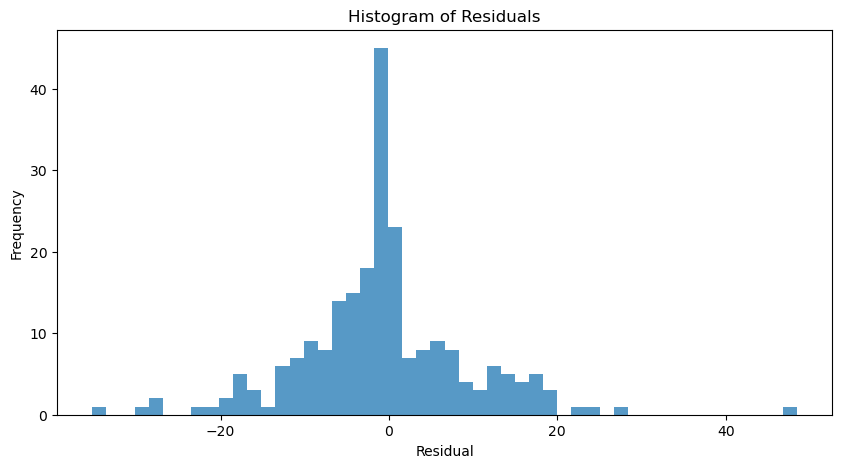

In [54]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义创建子图的函数，包括边界节点
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 使用最佳参数重新训练模型并评估
def evaluate_leave_one_out(data, best_params, region_mask, num_hops=2):
    # 提取特定区域节点
    test_idx = torch.where(region_mask)[0].numpy()
    train_idx = np.setdiff1d(np.arange(data.num_nodes), test_idx)
    
    # 创建训练和测试子图
    (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
    
    # 初始化模型和优化器
    model = GATv2(
        in_channels=train_x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=train_y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    # 训练模型
    model.train()
    for epoch in range(best_params['num_epochs']):
        loss = train(model, optimizer, data)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}')
    
    # 测试模型
    model.eval()
    with torch.no_grad():
        pred = model(test_x, test_edge_index)
        y_true = test_y.numpy()
        y_pred = pred.numpy()
        
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
    
    print(f'Test results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
    
    # 绘制残差图
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 5))
    plt.hist(residuals, bins=50, alpha=0.75)
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Histogram of Residuals')
    plt.show()
    # 将预测结果添加到GeoDataFrame中
    # gdf.loc[region_mask.cpu().numpy(), f'pred_{region_name}'] = y_pred.flatten()
    return mse, rmse, mae, r2

# 假设你已经有一个数据对象 data 和最佳参数 best_params
# data = ...
# best_params = ...

# 加载或创建GeoDataFrame gdf，这里假设gdf包含了每个节点的地理信息
# gdf = ...

# 假设LSOA21NM是GeoDataFrame中表示区域名称的列，并且我们要提取Southwark区域
region_name = 'Tower Hamlets'
region_mask = gdf['LSOA21NM'].str.contains(region_name)

# 将GeoDataFrame中的索引与图中的节点索引对齐，创建region_mask
region_mask = torch.tensor(region_mask.values, dtype=torch.bool, device=data.edge_index.device)

# 使用最佳参数重新训练模型并在特定区域上测试
mse, rmse, mae, r2 = evaluate_leave_one_out(data, best_params, region_mask)

Epoch 1/200, Loss: 676.1448
Epoch 2/200, Loss: 664.7095
Epoch 3/200, Loss: 657.1684
Epoch 4/200, Loss: 651.2439
Epoch 5/200, Loss: 645.3486
Epoch 6/200, Loss: 640.3615
Epoch 7/200, Loss: 635.2296
Epoch 8/200, Loss: 630.3127
Epoch 9/200, Loss: 625.1097
Epoch 10/200, Loss: 620.1716
Epoch 11/200, Loss: 614.7095
Epoch 12/200, Loss: 610.3830
Epoch 13/200, Loss: 605.1758
Epoch 14/200, Loss: 600.1440
Epoch 15/200, Loss: 594.9098
Epoch 16/200, Loss: 589.7650
Epoch 17/200, Loss: 584.6434
Epoch 18/200, Loss: 578.6240
Epoch 19/200, Loss: 573.5729
Epoch 20/200, Loss: 568.5252
Epoch 21/200, Loss: 563.4537
Epoch 22/200, Loss: 557.3890
Epoch 23/200, Loss: 551.6264
Epoch 24/200, Loss: 547.2156
Epoch 25/200, Loss: 541.1659
Epoch 26/200, Loss: 535.7914
Epoch 27/200, Loss: 529.7316
Epoch 28/200, Loss: 523.6081
Epoch 29/200, Loss: 517.8219
Epoch 30/200, Loss: 511.0336
Epoch 31/200, Loss: 506.1007
Epoch 32/200, Loss: 499.4454
Epoch 33/200, Loss: 493.0232
Epoch 34/200, Loss: 486.7050
Epoch 35/200, Loss: 479

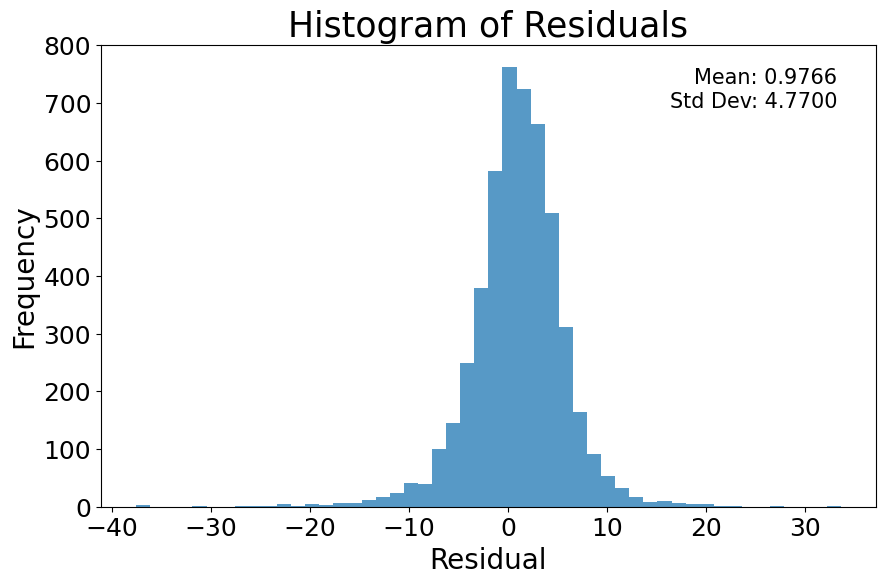

In [6]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# 定义GATv2模型
class GATv2_TwoLayer(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2_TwoLayer, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

# 定义训练函数
def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

# 定义评估函数
def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 假设你已经有一个数据对象 data 和最佳参数 best_params
# data = ...
# best_params = ...

# 初始化模型
model = GATv2_TwoLayer(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=data.y.shape[1], 
    dropout=best_params['dropout']
)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

# 训练模型并使用早停机制
losses = []
early_stopping = EarlyStopping(patience=10, min_delta=0.01)

for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)
    print(f'Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}')
    
    if early_stopping.step(loss):
        print(f'Early stopping at epoch {epoch + 1}')
        break

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    pred = model(data)
    residuals = data.y - pred

# 计算评估指标
y_true = data.y.detach().numpy()
y_pred = pred.detach().numpy()

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')
print(f'MAE: {mae:.4f}')
print(f'R²: {r2:.4f}')
# 计算残差的均值和标准差
residuals_np = residuals.detach().numpy()
mean_residual = np.mean(residuals_np)
std_residual = np.std(residuals_np)

# 可视化残差
plt.figure(figsize=(10, 6))
plt.hist(residuals_np, bins=50, alpha=0.75)
plt.xlabel('Residual', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.title('Histogram of Residuals', fontsize=25)
plt.tick_params(axis='both', which='major', labelsize=18)

# 在图中空白区域添加均值和标准差的文本
plt.text(0.95, 0.95, f'Mean: {mean_residual:.4f}\nStd Dev: {std_residual:.4f}', 
         horizontalalignment='right', verticalalignment='top', 
         transform=plt.gca().transAxes, fontsize=15)

output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# Save the plot to the output folder
output_path = os.path.join(output_folder, '残差图.png')
plt.savefig(output_path)
plt.show()


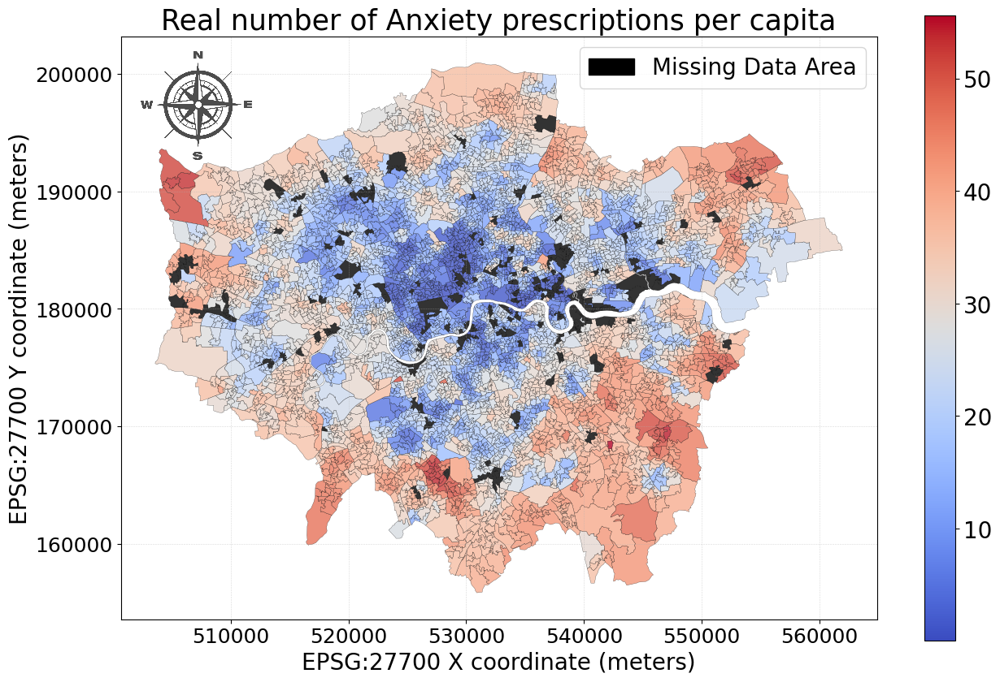

In [7]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from shapely import wkt
from matplotlib.patches import Patch
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os

def plot_variable_v2(gdf, variable, variable_name):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'coolwarm'

    # Parameters to display missing data in black
    missing_data_color = 'black'

    # Plotting the GeoPandas DataFrame
    ax = gdf.plot(column=variable, legend=True, figsize=(15, 10), cmap=colormap,
                  edgecolor='black', linewidth=0.2, alpha=0.8, 
                  missing_kwds={'color': missing_data_color, 'label': 'Missing Data'})

    # Add grid and set transparency
    plt.grid(True, linestyle='--', linewidth=0.4, alpha=0.5)

    # Customize the legend font size
    # Get the color bar object
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=20)  # Adjust the font size of the color bar ticks

    # Title
    plt.title(variable_name, fontsize=25)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)

    # Set tick font size for x and y axis
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # Add legend for missing data
    missing_patch = Patch(facecolor=missing_data_color, edgecolor='black', label='Missing Data Area')
    ax.legend(handles=[missing_patch], fontsize=20, loc='upper right')

    # 添加指北针
    north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
    arr_img = plt.imread(north_arrow_path)
    imagebox = OffsetImage(arr_img, zoom=0.1,alpha=0.7)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # Ensure the output folder exists
    output_folder = '论文出图'
    os.makedirs(output_folder, exist_ok=True)
    
    # Save the plot to the output folder
    output_path = os.path.join(output_folder, '焦虑症真值.png')
    plt.savefig(output_path)
    
    plt.show()

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 将预测结果作为新的一列加入GeoDataFrame
gdf['o_pred_outcome'] = y_pred

# Plot the variable
plot_variable_v2(gdf, 'o_anxiety_quantity_per_capita', 'Real number of Anxiety prescriptions per capita')
# target_column = 'o_diabetes_quantity_per_capita'
# target_column = 'o_hypertension_quantity_per_capita'
# target_column = 'o_asthma_quantity_per_capita'
# target_column = 'o_depression_quantity_per_capita'
# target_column = 'o_anxiety_quantity_per_capita'
# target_column = 'o_opioids_quantity_per_capita'

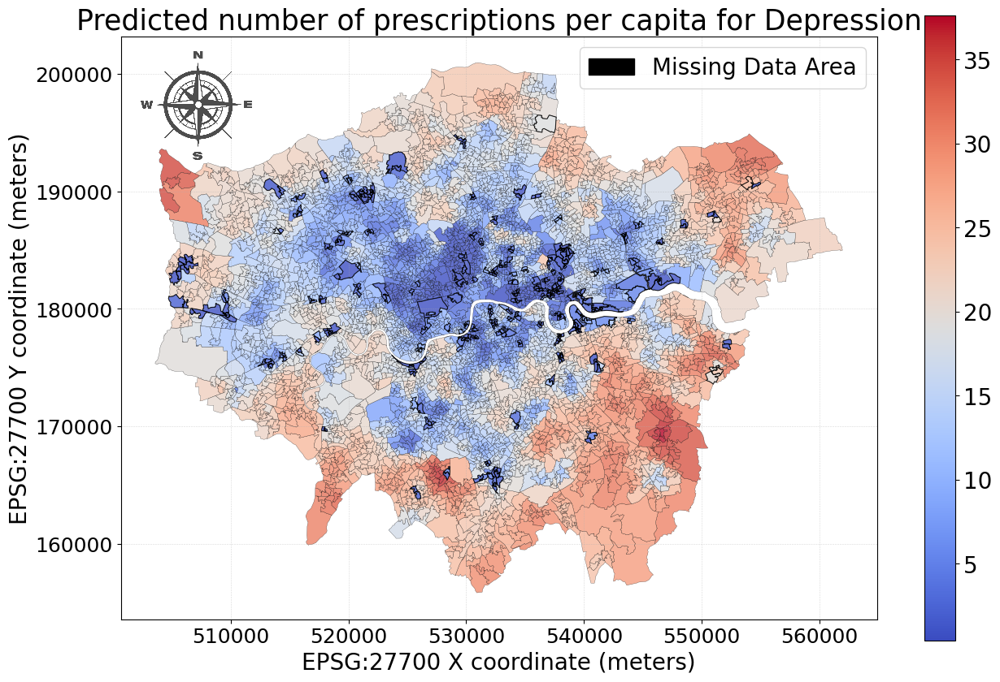

In [13]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from shapely import wkt
from matplotlib.patches import Patch
import os

def plot_variable_v2(gdf, variable, variable_name, original_missing_mask):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    # elif variable.startswith('o'):
    #     colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#6d9eeb'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'coolwarm'
    # Parameters to display missing data in black
    missing_data_color = 'black'

    # Plotting the GeoPandas DataFrame
    ax = gdf.plot(column=variable, legend=True, figsize=(15, 10), cmap=colormap,
                  edgecolor='black', linewidth=0.2, alpha=0.8, 
                  missing_kwds={'color': missing_data_color, 'label': 'Missing Data'})

    # Plotting the GeoPandas DataFrame
    # ax = gdf.plot(column=variable, legend=True, figsize=(15, 10), cmap=colormap,
    #               edgecolor='black', linewidth=0.2, alpha=0.8)

    # Plot original missing data as a separate layer with thicker edges
    gdf[original_missing_mask].boundary.plot(ax=ax, edgecolor='black', linewidth=0.8, alpha=0.8, label='Missing Data Area')

    # Add grid and set transparency
    plt.grid(True, linestyle='--', linewidth=0.4, alpha=0.5)

    # Customize the legend font size
    # Get the color bar object
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=20)  # Adjust the font size of the color bar ticks

    # Title
    plt.title(variable_name, fontsize=25)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)

    # Set tick font size for x and y axis
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    
    # Add legend for missing data
    missing_patch = Patch(facecolor=missing_data_color, edgecolor='black', label='Missing Data Area')
    ax.legend(handles=[missing_patch], fontsize=20, loc='upper right')

    # Add legend for originally missing data
    # original_missing_patch = Patch(facecolor='none', edgecolor='black', label='Missing Data Area')
    # ax.legend(handles=[original_missing_patch], fontsize=15, loc='upper right')

     # 添加指北针
    north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
    arr_img = plt.imread(north_arrow_path)
    imagebox = OffsetImage(arr_img, zoom=0.1,alpha=0.7)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # Ensure the output folder exists
    output_folder = '论文出图'
    os.makedirs(output_folder, exist_ok=True)
    
    # Save the plot to the output folder
    output_path = os.path.join(output_folder, '焦虑症预测.png')
    plt.savefig(output_path)
    
    plt.show()

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 标记原始缺失值
original_missing_mask_pred = gdf['o_anxiety_quantity_per_capita'].isna()

# 将预测结果作为新的一列加入GeoDataFrame
gdf['o_pred_outcome'] = y_pred
# gdf['o_residual'] = gdf['o_pred_outcome'] - gdf['o_depression_quantity_per_capita']
# Plot the predicted variable
plot_variable_v2(gdf, 'o_pred_outcome', 'Predicted number of prescriptions per capita for Anxiety', original_missing_mask_pred)
# target_column = 'o_diabetes_quantity_per_capita'
# target_column = 'o_hypertension_quantity_per_capita'
# target_column = 'o_asthma_quantity_per_capita'
# target_column = 'o_depression_quantity_per_capita'
# target_column = 'o_anxiety_quantity_per_capita'
# target_column = 'o_opioids_quantity_per_capita'

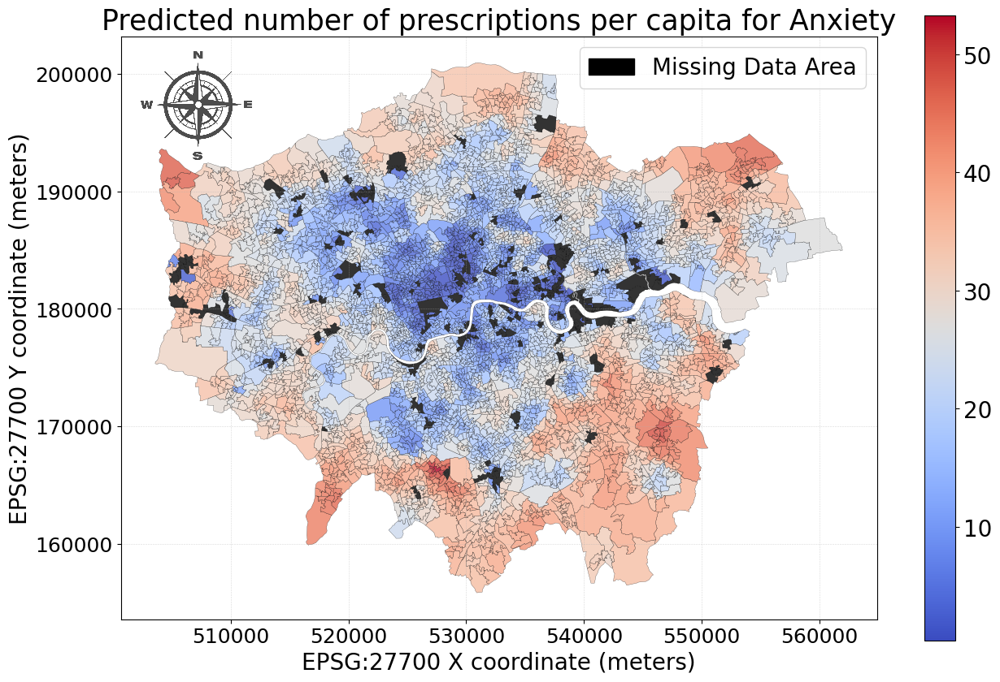

In [8]:
import os
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from shapely import wkt
from matplotlib.patches import Patch
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def plot_variable_v2(gdf, variable, variable_name, original_missing_mask):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'coolwarm'

    # Parameters to display missing data in black
    missing_data_color = 'black'

    # Plotting the GeoPandas DataFrame, excluding missing data
    ax = gdf[~original_missing_mask].plot(column=variable, legend=True, figsize=(15, 10), cmap=colormap,
                                          edgecolor='black', linewidth=0.2, alpha=0.8)

    # Plot original missing data as a separate layer, filling with black color
    gdf[original_missing_mask].plot(ax=ax, color=missing_data_color, edgecolor='black', linewidth=0.2, alpha=0.8, label='Missing Data Area')

    # Add grid and set transparency
    plt.grid(True, linestyle='--', linewidth=0.4, alpha=0.5)

    # Customize the legend font size
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=20)  # Adjust the font size of the color bar ticks

    # Title
    plt.title(variable_name, fontsize=25)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)

    # Set tick font size for x and y axis
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    
    # Add legend for missing data
    missing_patch = Patch(facecolor=missing_data_color, edgecolor='black', label='Missing Data Area')
    ax.legend(handles=[missing_patch], fontsize=20, loc='upper right')

    # 添加指北针
    north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
    arr_img = plt.imread(north_arrow_path)
    imagebox = OffsetImage(arr_img, zoom=0.1, alpha=0.7)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # Ensure the output folder exists
    output_folder = '论文出图'
    os.makedirs(output_folder, exist_ok=True)
    
    # Save the plot to the output folder
    output_path = os.path.join(output_folder, '焦虑症预测.png')
    plt.savefig(output_path)
    
    plt.show()

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 标记原始缺失值
original_missing_mask_pred = gdf['o_anxiety_quantity_per_capita'].isna()

# 将预测结果作为新的一列加入GeoDataFrame
gdf['o_pred_outcome'] = y_pred

# Plot the predicted variable
plot_variable_v2(gdf, 'o_pred_outcome', 'Predicted number of prescriptions per capita for Anxiety', original_missing_mask_pred)
# target_column = 'o_diabetes_quantity_per_capita'
# target_column = 'o_hypertension_quantity_per_capita'
# target_column = 'o_asthma_quantity_per_capita'
# target_column = 'o_depression_quantity_per_capita'
# target_column = 'o_anxiety_quantity_per_capita'
# target_column = 'o_opioids_quantity_per_capita'

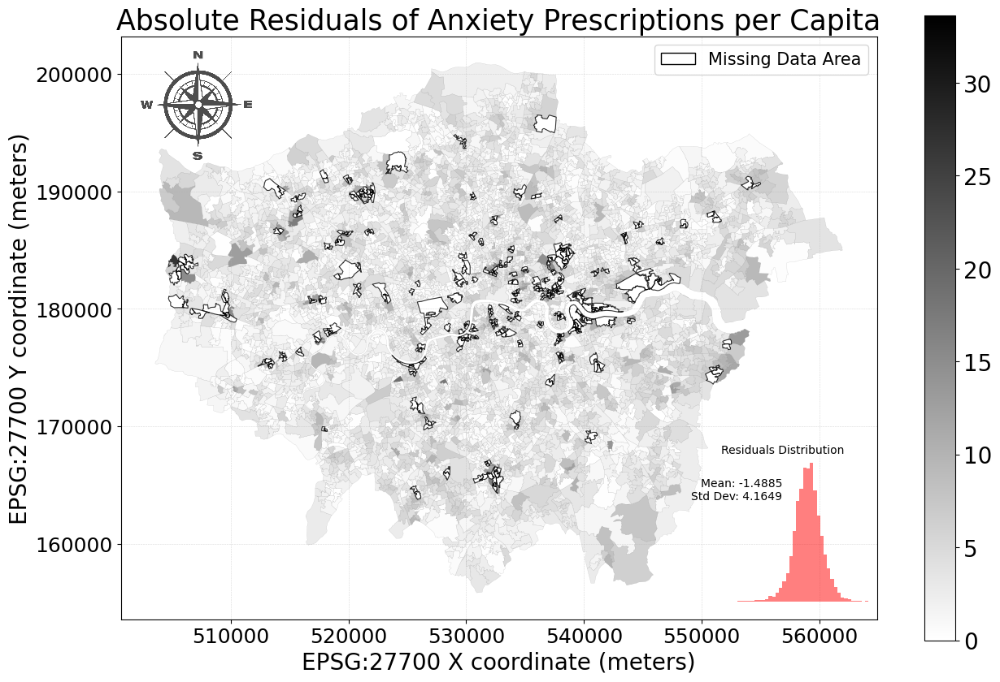

In [10]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from shapely import wkt
from matplotlib.patches import Patch
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np

def plot_variable_v2(gdf, variable, variable_name, original_missing_mask, residuals_np, mean_residual, std_residual):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'gray_r'

    # Plotting the GeoPandas DataFrame with color bar range from 0 to max value of the variable
    fig, ax = plt.subplots(figsize=(15, 10))
    gdf.plot(column=variable, legend=True, cmap=colormap, edgecolor='gray', linewidth=0.1, alpha=0.8, 
             vmin=0, vmax=gdf[variable].max(), ax=ax)

    # Plot original missing data as a separate layer with thicker edges
    gdf[original_missing_mask].boundary.plot(ax=ax, edgecolor='black', linewidth=0.8, alpha=0.8, label='Missing Data Area')

    # Add grid and set transparency
    plt.grid(True, linestyle='--', linewidth=0.4, alpha=0.5)

    # Customize the legend font size
    # 获取颜色条对象并调整其属性
    cbar = ax.get_figure().axes[-1]
    cbar.tick_params(labelsize=20)  # Adjust the font size of the color bar ticks

    # Title
    plt.title(variable_name, fontsize=25)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)

    # Set tick font size for x and y axis
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # Add legend for originally missing data
    original_missing_patch = Patch(facecolor='none', edgecolor='black', label='Missing Data Area')
    ax.legend(handles=[original_missing_patch], fontsize=15, loc='upper right')

    # 添加指北针
    north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
    arr_img = plt.imread(north_arrow_path)
    imagebox = OffsetImage(arr_img, zoom=0.1,alpha=0.7)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # 插入残差直方图作为子图，向右移动
    ax_inset = inset_axes(ax, width="25%", height="25%", loc="lower right", 
                          bbox_to_anchor=(0.0, 0.03, 1, 1), bbox_transform=ax.transAxes, borderpad=0)
    ax_inset.hist(residuals_np, bins=50, alpha=0.5, color='red')  # 调整颜色为深灰色
    ax_inset.set_title('Residuals Distribution', fontsize=10, pad=0)
    ax_inset.axis('off')  # 移除坐标轴框和标签

    # 在子图中添加均值和标准差的文本，调整文本位置
    ax_inset.text(0.5, 0.7, f'Mean: {mean_residual:.4f}\nStd Dev: {std_residual:.4f}', 
                  horizontalalignment='right', verticalalignment='baseline', 
                  transform=ax_inset.transAxes, fontsize=10, color='black')

    # Ensure the output folder exists
    output_folder = '论文出图'
    os.makedirs(output_folder, exist_ok=True)
    
    # Save the plot to the output folder
    output_path = os.path.join(output_folder, '焦虑症残差.png')
    plt.savefig(output_path)
    
    plt.show()

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 标记原始缺失值
original_missing_mask_pred = gdf['o_anxiety_quantity_per_capita'].isna()

# 计算残差的绝对值
gdf['o_pred_outcome'] = y_pred
gdf['o_residual'] = gdf['o_pred_outcome'] - gdf['o_anxiety_quantity_per_capita']

# 计算残差的均值和标准差，忽略NaN值
residuals_np = gdf['o_residual'].to_numpy()
mean_residual = np.nanmean(residuals_np)
std_residual = np.nanstd(residuals_np)
gdf['o_residual'] = abs(gdf['o_pred_outcome'] - gdf['o_anxiety_quantity_per_capita'])

# Plot the absolute value of the residuals with the histogram inset
plot_variable_v2(gdf, 'o_residual', 'Absolute Residuals of Anxiety Prescriptions per Capita', original_missing_mask_pred, residuals_np, mean_residual, std_residual)
# target_column = 'o_diabetes_quantity_per_capita'
# target_column = 'o_hypertension_quantity_per_capita'
# target_column = 'o_asthma_quantity_per_capita'
# target_column = 'o_depression_quantity_per_capita'
# target_column = 'o_anxiety_quantity_per_capita'
# target_column = 'o_opioids_quantity_per_capita'

Epoch 10/200, Loss: 1410.3813
Epoch 20/200, Loss: 1239.4835
Epoch 30/200, Loss: 1055.2327
Epoch 40/200, Loss: 856.7014
Epoch 50/200, Loss: 660.5979
Epoch 60/200, Loss: 485.3518
Epoch 70/200, Loss: 352.5774
Epoch 80/200, Loss: 255.9840
Epoch 90/200, Loss: 190.2309
Epoch 100/200, Loss: 152.3398
Epoch 110/200, Loss: 134.4800
Epoch 120/200, Loss: 118.4198
Epoch 130/200, Loss: 110.5673
Epoch 140/200, Loss: 101.9412
Epoch 150/200, Loss: 94.7266
Epoch 160/200, Loss: 92.0390
Epoch 170/200, Loss: 88.6475
Epoch 180/200, Loss: 82.8040
Epoch 190/200, Loss: 77.9664
Epoch 200/200, Loss: 78.8376
Test results - MSE: 52.1188, RMSE: 7.2193, MAE: 5.4180, R²: 0.7496


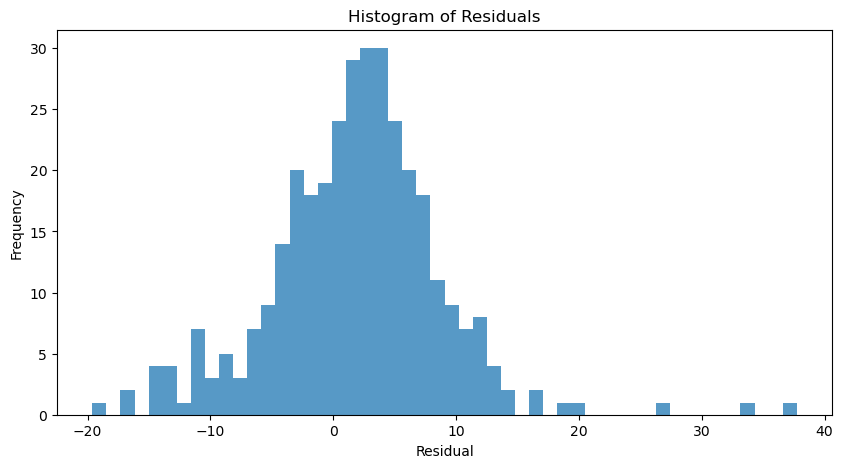

In [129]:
import torch
from torch_geometric.utils import k_hop_subgraph
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        x = self.fc1(x)
        return x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, data):
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        loss = F.mse_loss(out, data.y).item()
    return loss

# 定义早停机制
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = float('inf')
        self.counter = 0

    def step(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
        else:
            self.counter += 1

        return self.counter >= self.patience

# 定义创建子图的函数，包括边界节点
def create_subgraph(data, train_idx, test_idx, num_hops):
    train_idx = torch.tensor(train_idx, dtype=torch.long, device=data.edge_index.device)
    test_idx = torch.tensor(test_idx, dtype=torch.long, device=data.edge_index.device)
    
    # 获取训练集子图，包含 train_idx 节点以及 num_hops 范围内的邻居
    train_subgraph = k_hop_subgraph(train_idx, num_hops, data.edge_index, relabel_nodes=True)
    train_edge_index, train_x, train_y = train_subgraph[1], data.x[train_subgraph[0]], data.y[train_subgraph[0]]
    
    # 获取测试集子图，包含 test_idx 节点以及 num_hops 范围内的邻居
    test_subgraph = k_hop_subgraph(test_idx, num_hops, data.edge_index, relabel_nodes=True)
    test_edge_index, test_x, test_y = test_subgraph[1], data.x[test_subgraph[0]], data.y[test_subgraph[0]]
    
    return (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y)

# 使用最佳参数重新训练模型并评估
def evaluate_leave_one_out(data, best_params, region_mask, num_hops=2):
    # 提取特定区域节点
    test_idx = torch.where(region_mask)[0].numpy()
    train_idx = np.setdiff1d(np.arange(data.num_nodes), test_idx)
    
    # 创建训练和测试子图
    (train_x, train_edge_index, train_y), (test_x, test_edge_index, test_y) = create_subgraph(data, train_idx, test_idx, num_hops)
    
    # 初始化模型和优化器
    model = GATv2(
        in_channels=train_x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=train_y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    # 训练模型
    model.train()
    for epoch in range(best_params['num_epochs']):
        loss = train(model, optimizer, data)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{best_params["num_epochs"]}, Loss: {loss:.4f}')
    
    # 测试模型
    model.eval()
    with torch.no_grad():
        pred = model(test_x, test_edge_index)
        y_true = test_y.numpy()
        y_pred = pred.numpy()
        
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
    
    print(f'Test results - MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}')
    
    # 绘制残差图
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 5))
    plt.hist(residuals, bins=50, alpha=0.75)
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Histogram of Residuals')
    plt.show()
    
    return mse, rmse, mae, r2

# 假设你已经有一个数据对象 data 和最佳参数 best_params
# data = ...
# best_params = ...

# 加载或创建GeoDataFrame gdf，这里假设gdf包含了每个节点的地理信息
# gdf = ...

# 假设LSOA21NM是GeoDataFrame中表示区域名称的列，并且我们要提取Southwark区域
region_name = 'Croydon'
region_mask = gdf['LSOA21NM'].str.contains(region_name)

# 将GeoDataFrame中的索引与图中的节点索引对齐，创建region_mask
region_mask = torch.tensor(region_mask.values, dtype=torch.bool, device=data.edge_index.device)

# 使用最佳参数重新训练模型并在特定区域上测试
mse, rmse, mae, r2 = evaluate_leave_one_out(data, best_params, region_mask)

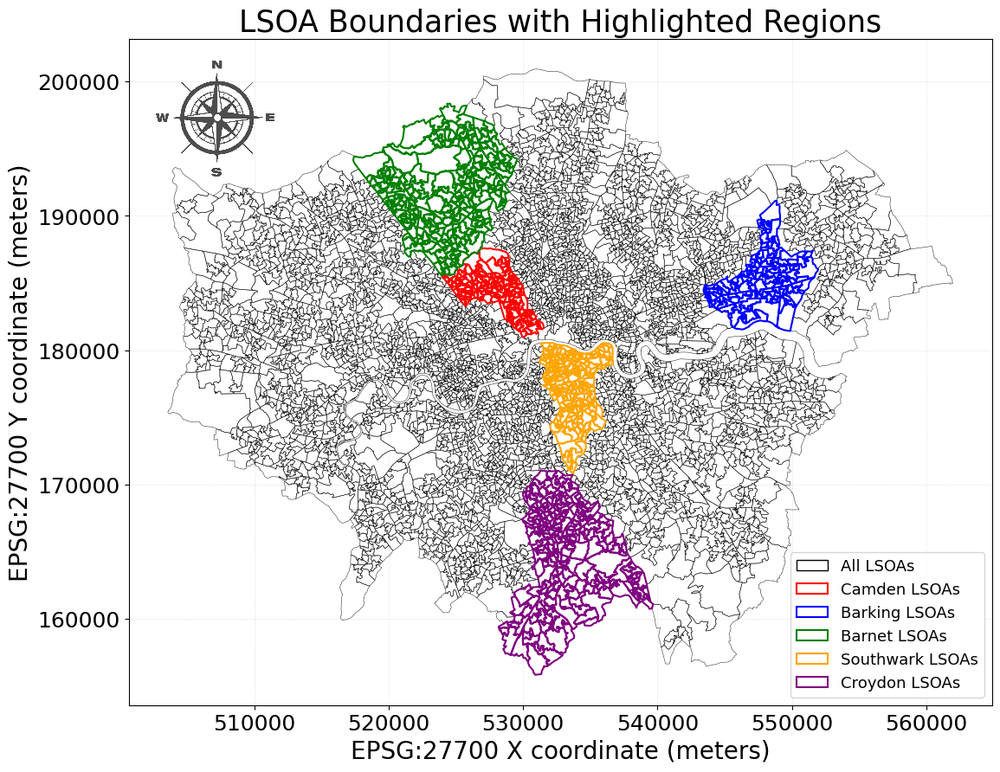

In [90]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely import wkt
from matplotlib.patches import Patch
import os

def plot_lsoa_boundaries(gdf, regions):
    # 定义颜色列表
    colors = ['red', 'blue', 'green', 'orange', 'purple']
    
    # Plotting the GeoPandas DataFrame boundaries
    ax = gdf.boundary.plot(edgecolor='black', linewidth=0.4, figsize=(15, 10), alpha=0.8)

    # Highligh specific regions
    legend_patches = []
    for i, region in enumerate(regions):
        region_name = region['name']
        region_mask = gdf['LSOA21NM'].str.contains(region_name)
        gdf[region_mask].boundary.plot(ax=ax, edgecolor=colors[i], linewidth=1.5, alpha=1, label=f'{region_name} LSOAs')
        legend_patches.append(Patch(facecolor='none', edgecolor=colors[i], linewidth=1.5, label=f'{region_name} LSOAs'))

    # Add grid and set transparency
    plt.grid(True, linestyle='--', linewidth=0.4, alpha=0.4)

    # Customize the legend font size
    # Title
    plt.title('LSOA Boundaries with Highlighted Regions', fontsize=25)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)

    # Set tick font size for x and y axis
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # Add legend for highlighted regions
    all_lsoa_patch = Patch(facecolor='none', edgecolor='black', label='All LSOAs')
    ax.legend(handles=[all_lsoa_patch] + legend_patches, fontsize=13, loc='lower right')

    # 添加指北针
    north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
    arr_img = plt.imread(north_arrow_path)
    imagebox = OffsetImage(arr_img, zoom=0.1,alpha=0.7)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)


    # Ensure the output folder exists
    output_folder = '论文出图'
    os.makedirs(output_folder, exist_ok=True)
    
    # Save the plot to the output folder
    output_path = os.path.join(output_folder, 'Highlighted_LSOA_Boundaries.png')
    plt.savefig(output_path)
    
    plt.show()

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 定义要高亮显示的区域
regions = [
    {'name': 'Camden'},
    {'name': 'Barking'},
    {'name': 'Barnet'},
    {'name': 'Southwark'},
    {'name': 'Croydon'}
]

# Plot the LSOA boundaries with the specific regions highlighted
plot_lsoa_boundaries(gdf, regions)

Epoch 10/200, Loss: 27.3893
Epoch 20/200, Loss: 9.0379
Epoch 30/200, Loss: 8.2063
Epoch 40/200, Loss: 6.5937
Epoch 50/200, Loss: 5.9092
Epoch 60/200, Loss: 5.1772
Epoch 70/200, Loss: 4.8299
Epoch 80/200, Loss: 4.3180
Epoch 90/200, Loss: 4.0164
Epoch 100/200, Loss: 3.7793
Epoch 110/200, Loss: 3.7113
Epoch 120/200, Loss: 3.5232
Epoch 130/200, Loss: 3.2467
Epoch 140/200, Loss: 3.1427
Epoch 150/200, Loss: 3.0395
Epoch 160/200, Loss: 2.9924
Epoch 170/200, Loss: 2.8254
Epoch 180/200, Loss: 2.6702
Epoch 190/200, Loss: 2.6119
Epoch 200/200, Loss: 2.4529
Shape of conv1 embeddings: (4994, 64)
Shape of conv2 embeddings: (4994, 64)
Explained Variance Ratio: [0.6093185  0.21895121]
PCA1 Top Contributors:
26    0.017990
34    0.017034
41    0.016502
27    0.016412
51    0.016193
42    0.015977
15    0.015794
12    0.015397
10    0.015073
59    0.014399
29    0.014366
60    0.013900
5     0.013777
46    0.013728
23    0.013579
39    0.013546
25    0.013446
24    0.012987
6     0.012910
9     0.012570

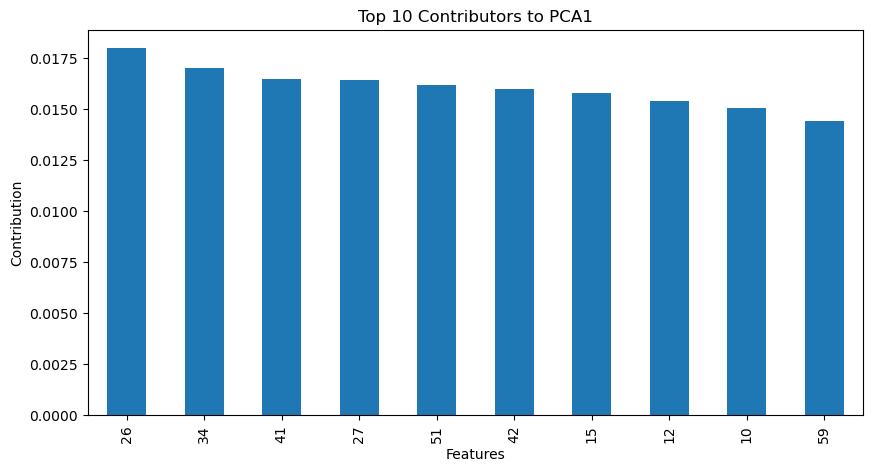

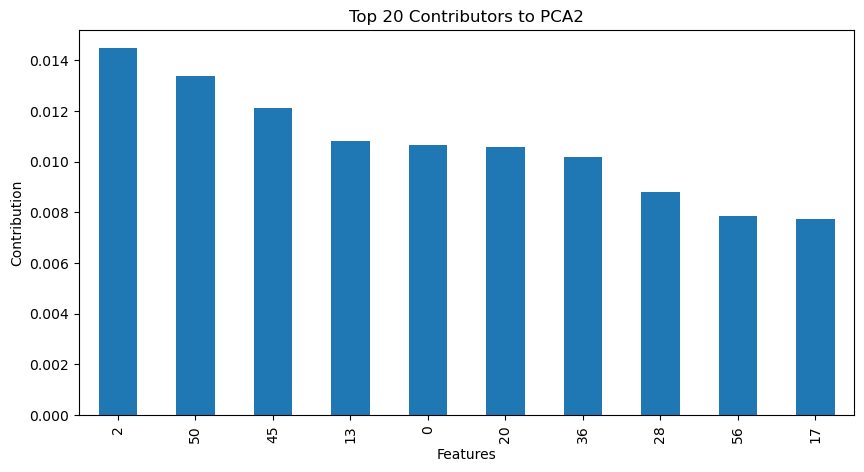

In [6]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv1_out = x  # 保存第一层卷积的输出
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv2_out = x  # 保存第二层卷积的输出
        x = self.fc1(x)
        return conv1_out, conv2_out, x

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    _, _, out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def train_with_best_params(data, best_params, num_epochs=200):
    model = GATv2(
        in_channels=data.x.shape[1], 
        hidden1=best_params['hidden1'], 
        hidden2=best_params['hidden2'], 
        out_channels=data.y.shape[1], 
        dropout=best_params['dropout']
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    losses = []
    for epoch in range(num_epochs):
        loss = train(model, optimizer, data)
        losses.append(loss)
        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss:.4f}')
    return model, losses

# 使用最佳参数训练模型
# 假设你已经有一个数据对象 data 和最佳参数 best_params
# best_params = {'lr': 0.005, 'weight_decay': 0.001, 'hidden1': 64, 'hidden2': 32, 'dropout': 0.5}
model, losses = train_with_best_params(data, best_params)

# 提取嵌入
model.eval()
with torch.no_grad():
    conv1_out, conv2_out, _ = model(data.x, data.edge_index)
    conv1_embeddings = conv1_out.cpu().numpy()
    conv2_embeddings = conv2_out.cpu().numpy()

# 确保嵌入已定义
print(f"Shape of conv1 embeddings: {conv1_embeddings.shape}")
print(f"Shape of conv2 embeddings: {conv2_embeddings.shape}")

# 确保 n_components 设置正确
pca_components = 2
if min(conv2_embeddings.shape) < pca_components:
    pca_components = min(conv2_embeddings.shape)

# 计算PCA并获取解释方差比
pca = PCA(n_components=pca_components, random_state=0)
pca_result = pca.fit_transform(conv2_embeddings)
explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained Variance Ratio: {explained_variance_ratio}")

# 计算载荷
loadings = pca.components_.T

# 计算特征贡献度（解释方差比乘以载荷的平方）
contributions = loadings ** 2 * explained_variance_ratio

# 创建贡献度矩阵DataFrame
contribution_matrix = pd.DataFrame(contributions, columns=[f'PCA{i+1}' for i in range(pca_components)])

# 打印每个主成分的前几个变量及其贡献
print("PCA1 Top Contributors:")
print(contribution_matrix['PCA1'].sort_values(ascending=False).head(20))

if pca_components > 1:
    print("\nPCA2 Top Contributors:")
    print(contribution_matrix['PCA2'].sort_values(ascending=False).head(20))

# 可视化每个主成分的前几个变量及其贡献
plt.figure(figsize=(10, 5))
contribution_matrix['PCA1'].sort_values(ascending=False).head(10).plot(kind='bar')
plt.title('Top 10 Contributors to PCA1')
plt.xlabel('Features')
plt.ylabel('Contribution')
plt.show()

if pca_components > 1:
    plt.figure(figsize=(10, 5))
    contribution_matrix['PCA2'].sort_values(ascending=False).head(10).plot(kind='bar')
    plt.title('Top 20 Contributors to PCA2')
    plt.xlabel('Features')
    plt.ylabel('Contribution')
    plt.show()

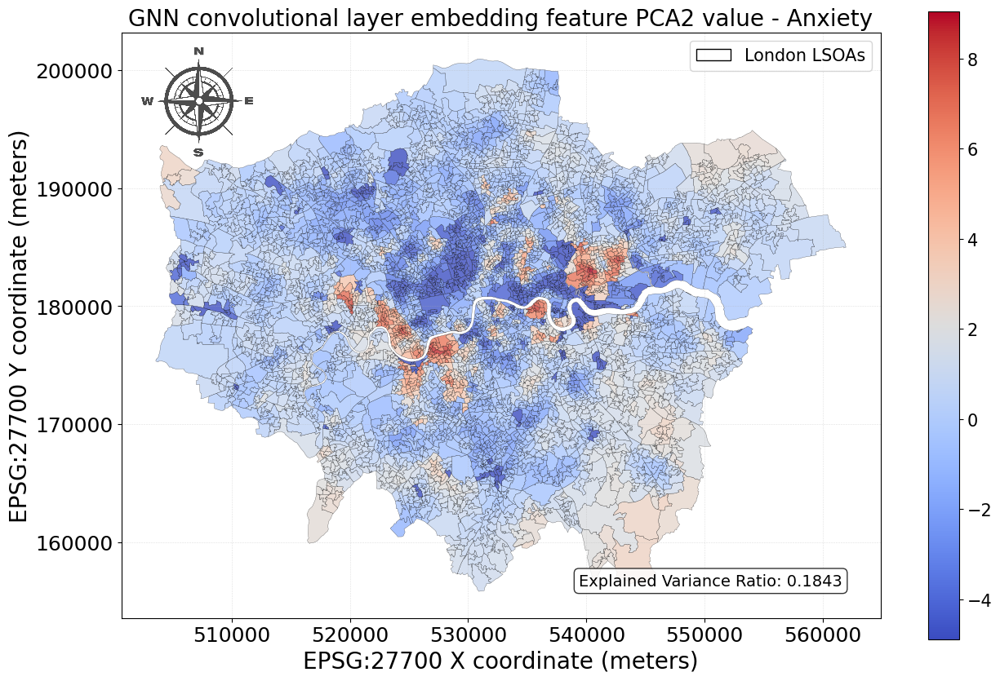

In [14]:
def plot_variable_v2(gdf, variable, variable_name):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    # elif variable.startswith('o'):
    #     colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#6d9eeb'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'coolwarm'

    # Plotting the GeoPandas DataFrame
    ax = gdf.plot(column=variable, legend=True, figsize=(15, 10), cmap=colormap,
                  edgecolor='black', linewidth=0.2, alpha=0.8)

    # Add grid and set transparency
    plt.grid(True, linestyle='--', linewidth=0.4, alpha=0.4)

    # Customize the legend font size
    # Get the color bar object
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=15)

    # Title
    plt.title(variable_name, fontsize=20)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)

    # Set tick font size for x and y axis
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    # 添加解释方差比文本信息，放置在右下角
    textstr = f'Explained Variance Ratio: {explained_variance_ratio[1]:.4f}'
    props = dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white', alpha=0.8)
    ax.text(0.95, 0.05, textstr, transform=ax.transAxes, fontsize=14,
            verticalalignment='bottom', horizontalalignment='right', bbox=props)

    # 添加指北针
    north_arrow_path = "north arrow.png"  # 替换为你的指北针图片路径
    arr_img = plt.imread(north_arrow_path)
    imagebox = OffsetImage(arr_img, zoom=0.1,alpha=0.7)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.88), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # Add legend for originally missing data
    original_missing_patch = Patch(facecolor='none', edgecolor='black', label='London LSOAs')
    ax.legend(handles=[original_missing_patch], fontsize=15, loc='upper right')

    # Ensure the output folder exists
    output_folder = '论文出图'
    os.makedirs(output_folder, exist_ok=True)
    
    # Save the plot to the output folder
    output_path = os.path.join(output_folder, 'PCA结果 -Anxiety2.png')
    plt.savefig(output_path)
    
    plt.show()
# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf_plot = gpd.GeoDataFrame(df, geometry='geometry')

# 将PCA结果添加到GeoDataFrame中
# gdf_plot['PCA1'] = pca_result[:, 0]
gdf_plot['PCA2'] = pca_result[:, 1]
# gdf_plot['PCA3'] = pca_result[:, 2]

# 可视化PCA1和PCA2
# plot_variable_v2(gdf_plot, 'PCA1', 'GNN convolutional layer embedding feature PCA1 value - Anxiety')
plot_variable_v2(gdf_plot, 'PCA2', 'GNN convolutional layer embedding feature PCA2 value - Anxiety')
# plot_variable_v2(gdf_plot, 'PCA3', 'PCA3')

# target_column = 'o_diabetes_quantity_per_capita'
# target_column = 'o_hypertension_quantity_per_capita'
# target_column = 'o_asthma_quantity_per_capita'
# target_column = 'o_depression_quantity_per_capita'
# target_column = 'o_anxiety_quantity_per_capita'
# target_column = 'o_opioids_quantity_per_capita'

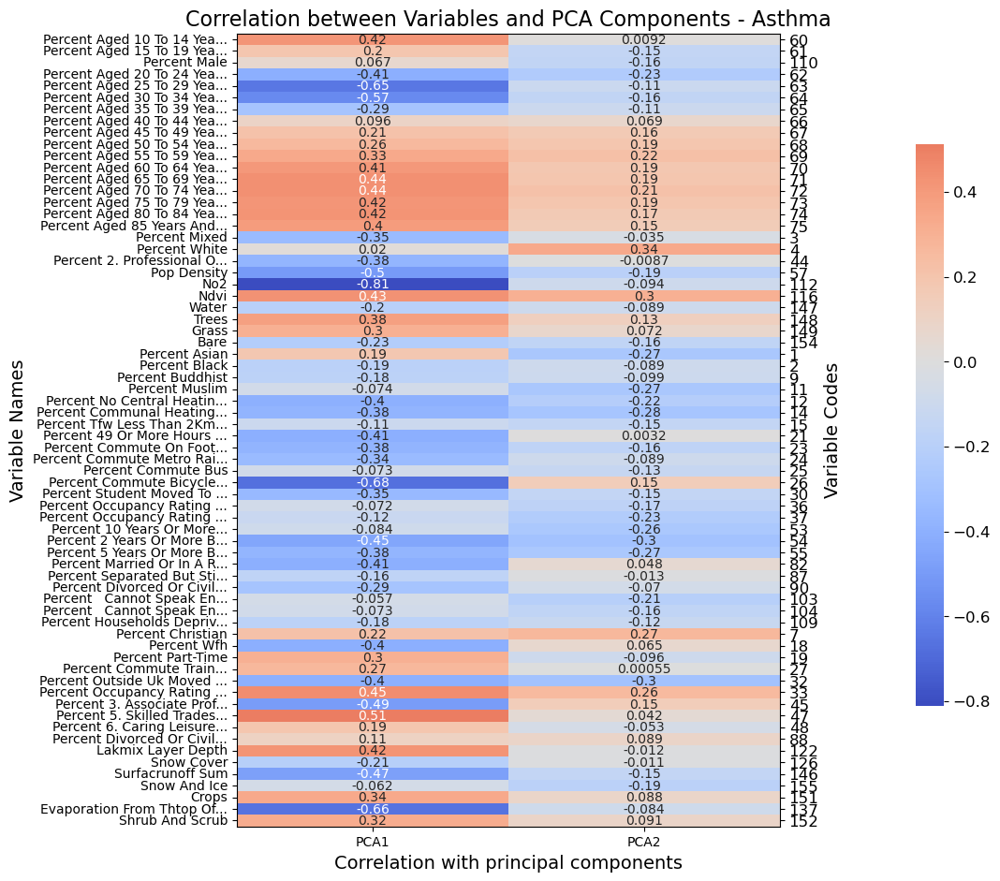

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from sklearn.preprocessing import StandardScaler

# 读取变量编码文件
variable_codes_df = pd.read_csv('variable_codes.csv')

# 提取PCA主成分
pca_df = pd.DataFrame(pca_result, columns=[f'PCA{i+1}' for i in range(pca_components)])

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 固定选取的变量
fixed_columns = [
    'c_percent Aged 10 to 14 years', 'c_percent Aged 15 to 19 years', 'c_percent male',
       'c_percent Aged 20 to 24 years', 'c_percent Aged 25 to 29 years',
       'c_percent Aged 30 to 34 years', 'c_percent Aged 35 to 39 years',
       'c_percent Aged 40 to 44 years', 'c_percent Aged 45 to 49 years',
        'c_percent Aged 50 to 54 years', 'c_percent Aged 55 to 59 years',
        'c_percent Aged 60 to 64 years', 'c_percent Aged 65 to 69 years',
       'c_percent Aged 70 to 74 years', 'c_percent Aged 75 to 79 years',
       'c_percent Aged 80 to 84 years', 'c_percent Aged 85 years and over',
       'c_percent mixed', 'c_percent white',
       'c_percent 2. Professional occupations', 'c_pop_density', 'e_NO2',
       'e_ndvi', 'e_water', 'e_trees', 'e_grass', 'e_bare', 'c_percent asian',
       'c_percent black', 'c_percent buddhist', 'c_percent muslim',
       'c_percent no central heating', 'c_percent communal heating',
       'c_percent TFW less than 2km', 'c_percent 49 or more hours worked',
       'c_percent commute on foot', 'c_percent commute metro rail',
       'c_percent commute bus', 'c_percent commute bicycle',
       'c_percent student moved to address',
       'c_percent occupancy rating bedrooms -2',
       'c_percent occupancy rating bedrooms -1', 'c_percent 10 years or more',
       'c_percent 2 years or more but less than 5 years',
       'c_percent 5 years or more but less than 10 years',
       # 'c_percent married or in a registered civil partnership married same sex',
       'c_percent married or in a registered civil partnership in a registered civil partnership',
       'c_percent separated but still legally married or still legally in a civil partnership separated but still in a registered civil partnership',
       'c_percent divorced or civil partnership dissolved formerly in a civil partnership now legally dissolved',
       'c_percent   cannot speak english well',
       'c_percent   cannot speak english',
       'c_percent households deprived in four dimensions',
       'c_percent christian', 'c_percent WFH', 'c_percent part-time',
       'c_percent commute train', 'c_percent outside UK moved to address',
       'c_percent occupancy rating bedrooms +2',
       'c_percent 3. Associate professional and technical occupations',
       'c_percent 5. Skilled trades occupations',
       'c_percent 6. Caring leisure and other service occupations',
       'c_percent divorced or civil partnership dissolved',
       'e_lake_mix_layer_depth', 'e_snow_cover', 'e_surface_runoff_sum',
       'e_snow_and_ice', 'e_crops', 'e_evaporation_from_the_top_of_canopy_sum',
       'e_shrub_and_scrub'
]
# 处理变量名
processed_variable_names = [var.replace('e_', '').replace('c_', '').replace('_', ' ').title() for var in fixed_columns]

# 提取固定变量
fixed_features = gdf[fixed_columns].apply(pd.to_numeric, errors='coerce')

# 标准化固定变量
scaler = StandardScaler()
fixed_features_scaled = scaler.fit_transform(fixed_features)
fixed_features_df = pd.DataFrame(fixed_features_scaled, columns=fixed_columns)

# 计算PCA主成分与固定变量的相关性
correlation_matrix = fixed_features_df.join(pca_df).corr()
pca_corr = correlation_matrix.loc[fixed_columns, [f'PCA{i+1}' for i in range(pca_components)]]

# 截断标签名称为25个字符并添加省略号
short_labels = [label[:25] + '...' if len(label) > 20 else label for label in processed_variable_names]

# 提取处理后变量名对应的编码
codes = variable_codes_df.set_index('Variable Name')['Code'].reindex(processed_variable_names).values

# 可视化相关性矩阵
fig, ax = plt.subplots(figsize=(10, 11))  # 增加图的宽度以适应色条调整
sns.heatmap(pca_corr, annot=True, cmap='coolwarm', center=0,
            xticklabels=[f'PCA{i+1}' for i in range(pca_components)],
            yticklabels=short_labels, ax=ax, cbar_kws={"shrink": 1})  # 缩小色条

# 添加右侧的坐标轴显示编码
ax_code = ax.twinx()  # 创建右侧坐标轴
ax_code.set_ylim(ax.get_ylim())  # 同步y轴范围
ax_code.set_yticks(ax.get_yticks())  # 使用相同的y轴刻度
ax_code.set_yticklabels(codes, fontsize=12)  # 设置编码为标签
ax_code.set_ylabel('Variable Codes', fontsize=14)  # 添加右侧坐标标签

# 隐藏右侧y轴的网格线
ax_code.grid(False)

# 添加左侧坐标标签
ax.set_ylabel('Variable Names', fontsize=14)

# 设置底部坐标标签
ax.set_xlabel('Correlation with principal components', fontsize=14)

# 确保热图和编码的对应
plt.subplots_adjust(right=0.85)  # 调整右侧边距，给色条留出空间

# 调整色条位置
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_position([0.85, 0.1, 0.03, 0.8])  # [left, bottom, width, height]

plt.title('Correlation between Variables and PCA Components - Asthma', fontsize=16)

# Ensure the output folder exists
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# Save the plot to the output folder
output_path = os.path.join(output_folder, 'PCA热图-AS.png')
plt.savefig(output_path)

plt.show()


In [102]:
variable_codes_df

,Variable Name,Code
0,Percent Asian,1
1,Percent Black,2
2,Percent Mixed,3
3,Percent White,4
4,Percent Sikh,5
...,...,...
150,Crops,151
151,Shrub And Scrub,152
152,Built,153
153,Bare,154


In [105]:
processed_variable_names

['Percent Aged 10 To 14 Years',
 'Percent Aged 15 To 19 Years',
 'Percent Aged 20 To 24 Years',
 'Percent Aged 25 To 29 Years',
 'Percent Aged 30 To 34 Years',
 'Percent Aged 35 To 39 Years',
 'Percent Aged 40 To 44 Years',
 'Percent Aged 65 To 69 Years',
 'Percent Aged 70 To 74 Years',
 'Percent Aged 75 To 79 Years',
 'Percent Aged 80 To 84 Years',
 'Percent Aged 85 Years And Over',
 'Percent Mixed',
 'Percent White',
 'Percent 2. Professional Occupations',
 'Pop Density',
 'No2',
 'Ndvi',
 'Water',
 'Trees',
 'Grass',
 'Bare',
 'Percent Asian',
 'Percent Black',
 'Percent Buddhist',
 'Percent Muslim',
 'Percent No Central Heating',
 'Percent Communal Heating',
 'Percent Tfw Less Than 2Km',
 'Percent 49 Or More Hours Worked',
 'Percent Commute On Foot',
 'Percent Commute Metro Rail',
 'Percent Commute Bus',
 'Percent Commute Bicycle',
 'Percent Student Moved To Address',
 'Percent Occupancy Rating Bedrooms -2',
 'Percent Occupancy Rating Bedrooms -1',
 'Percent 10 Years Or More',
 'Pe

In [170]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv1_out = x  # 保存第一层卷积的输出
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv2_out = x  # 保存第二层卷积的输出
        x = self.fc1(x)
        return conv1_out, conv2_out, x

# 包装模型，只返回最终的输出
class WrappedModel(torch.nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x, edge_index):
        _, _, out = self.model(x, edge_index)
        return out

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    _, _, out = model(data.x, data.edge_index)  # Unpack the tuple and use only the final output
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()

# Assuming 'data' is a pre-defined PyG data object
model = GATv2(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=data.y.shape[1], 
    dropout=best_params['dropout']
)
wrapped_model = WrappedModel(model)
optimizer = torch.optim.Adam(model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])

losses = []
for epoch in range(best_params['num_epochs']):
    loss = train(model, optimizer, data)
    losses.append(loss)

# 测试模型并计算评估指标
model.eval()
with torch.no_grad():
    _, _, pred = model(data.x, data.edge_index)  # Unpack the tuple and use only the final output
    residuals = data.y - pred

# 计算评估指标
y_true = data.y.detach().numpy()
y_pred = pred.detach().numpy()

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f'MSE: {mse:.4f}')
print(f'RMSE: {rmse:.4f}')
print(f'MAE: {mae:.4f}')
print(f'R²: {r2:.4f}')

MSE: 6.2899
RMSE: 2.5080
MAE: 1.7324
R²: 0.9245


In [29]:
# 加载数据对象
data = torch.load('data.pt')

best_params = {'lr': 0.005,
 'weight_decay': 0.001,
 'hidden1': 128,
 'hidden2': 64,
 'dropout': 0.3,
 'num_epochs': 200}

In [30]:
import torch
from torch_geometric.nn import GATv2Conv
# 定义GATv2模型
class GATv2(torch.nn.Module):
    def __init__(self, in_channels, hidden1, hidden2, out_channels, dropout):
        super(GATv2, self).__init__()
        self.conv1 = GATv2Conv(in_channels, hidden1, heads=1)
        self.bn1 = torch.nn.BatchNorm1d(hidden1)  # Batch normalization
        self.conv2 = GATv2Conv(hidden1, hidden2, heads=1)
        self.bn2 = torch.nn.BatchNorm1d(hidden2)  # Batch normalization
        self.fc1 = torch.nn.Linear(hidden2, out_channels)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = self.bn1(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv1_out = x  # 保存第一层卷积的输出
        x = self.conv2(x, edge_index)
        x = self.bn2(x)  # Batch normalization
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)  # Dropout
        conv2_out = x  # 保存第二层卷积的输出
        x = self.fc1(x)
        return conv1_out, conv2_out, x
# 假设 'data' 是一个预定义的 PyG 数据对象

# 包装模型，只返回最终的输出
class WrappedModel(torch.nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x, edge_index):
        _, _, out = self.model(x, edge_index)
        return out

def train(model, optimizer, data):
    model.train()
    optimizer.zero_grad()
    _, _, out = model(data.x, data.edge_index)  # Unpack the tuple and use only the final output
    loss = F.mse_loss(out, data.y)
    loss.backward()
    optimizer.step()
    return loss.item()
    
model = GATv2(
    in_channels=data.x.shape[1], 
    hidden1=best_params['hidden1'], 
    hidden2=best_params['hidden2'], 
    out_channels=data.y.shape[1], 
    dropout=best_params['dropout']
)

# 方法1：加载整个模型
loaded_model = torch.load('good_explanation.pth')
wrapped_model = WrappedModel(loaded_model)
wrapped_model.eval()

WrappedModel(
  (model): GATv2(
    (conv1): GATv2Conv(64, 128, heads=1)
    (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): GATv2Conv(128, 64, heads=1)
    (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=64, out_features=1, bias=True)
  )
)

Generated explanations in ['edge_mask', 'node_mask']


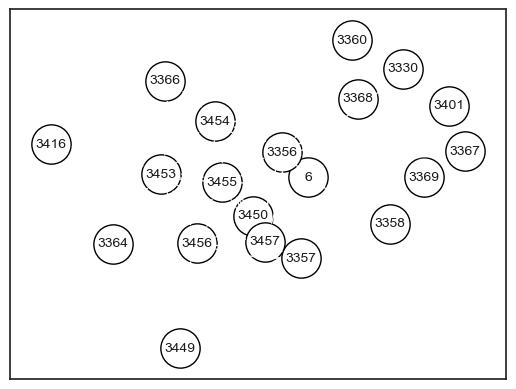

In [34]:
from torch_geometric.explain import Explainer, GNNExplainer
from tqdm import tqdm
for explanation_type in ['phenomenon']:
    explainer = Explainer(
        model=wrapped_model,
        algorithm=GNNExplainer(epochs=200),
        explanation_type=explanation_type,
        node_mask_type='object',
        edge_mask_type='object',
        model_config=dict(
            mode='regression',
            task_level='node',
            return_type='raw',
        ),
        # threshold_config=dict(threshold_type='hard', value=0.5) 
    )

# 选择一个节点进行解释（例如，节点0）
node_idx = 3455
explanation = explainer(data.x, data.edge_index, index=node_idx, target = data.y,)

# 输出解释结果
print(f'Generated explanations in {explanation.available_explanations}')

# 可视化特征重要性
# path = 'feature_importance.png'
# explanation.visualize_feature_importance(path, top_k=10)
# print(f"Feature importance plot has been saved to '{path}'")

# # 可视化子图
# path = 'subgraph.pdf'
# explanation.visualize_graph(path)
# print(f"Subgraph visualization plot has been saved to '{path}'")

# 获取子图节点索引
edge_mask = explanation.edge_mask > 0  # 使用掩码阈值
edge_index = data.edge_index[:, edge_mask]
node_indices = edge_index.unique().tolist()

explanation.visualize_graph()

In [32]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx

# 读取LSOA的shapefile并转换坐标系
fp = 'LSOA_(Dec_2021)_Boundaries_Generalised_Clipped_EW_(BGC).shp'
London_lsoas_2021 = gpd.read_file(fp).rename(columns={'LSOA21CD':'geography code'})
London_lsoas_2021 = London_lsoas_2021[London_lsoas_2021["geography code"].str.startswith("E")]

# 设置原始坐标系为EPSG:27700（英国国家格网）
London_lsoas_2021.set_crs(epsg=27700, inplace=True)
# 转换为WGS84坐标系（EPSG:4326）
London_lsoas_2021 = London_lsoas_2021.to_crs(epsg=4326)
# 转换为墨卡托投影以匹配OpenStreetMap
London_lsoas_2021 = London_lsoas_2021.to_crs(epsg=3857)

Node indices: [   6 3330 3356 3357 3358 3360 3364 3366 3367 3368 3369 3401 3416 3449
 3450 3453 3454 3455 3456 3457]
Edge indices: [   36 19770 19926 19928 19931 19933 19938 19939 19940 19954 19974 19986
 19987 19990 19996 20000 20002 20199 20295 20484 20491 20492 20507 20508
 20509 20510 20513 20514 20515 20516 20517 20518 20519 20523 20524 20525
 20526 20528 20529]
Node positions: {6: (543631.4493965654, 184385.2518637335), 3330: (541865.8602534509, 183707.02637275247), 3356: (542264.0216580781, 184080.49691803806), 3357: (542542.153034213, 183814.16829912883), 3358: (542179.6139092873, 183835.86937817014), 3360: (542042.4046183934, 183582.56188435626), 3364: (542939.9328797493, 184910.4946108677), 3366: (542767.8461111177, 184716.5253453401), 3367: (542071.948306461, 184407.99893054357), 3368: (542511.7698517095, 184487.42806677107), 3369: (541781.4639524732, 184246.75184527415), 3401: (541589.927801801, 184072.9923582584), 3416: (543336.1992768531, 185170.80656443178), 3449: (54304

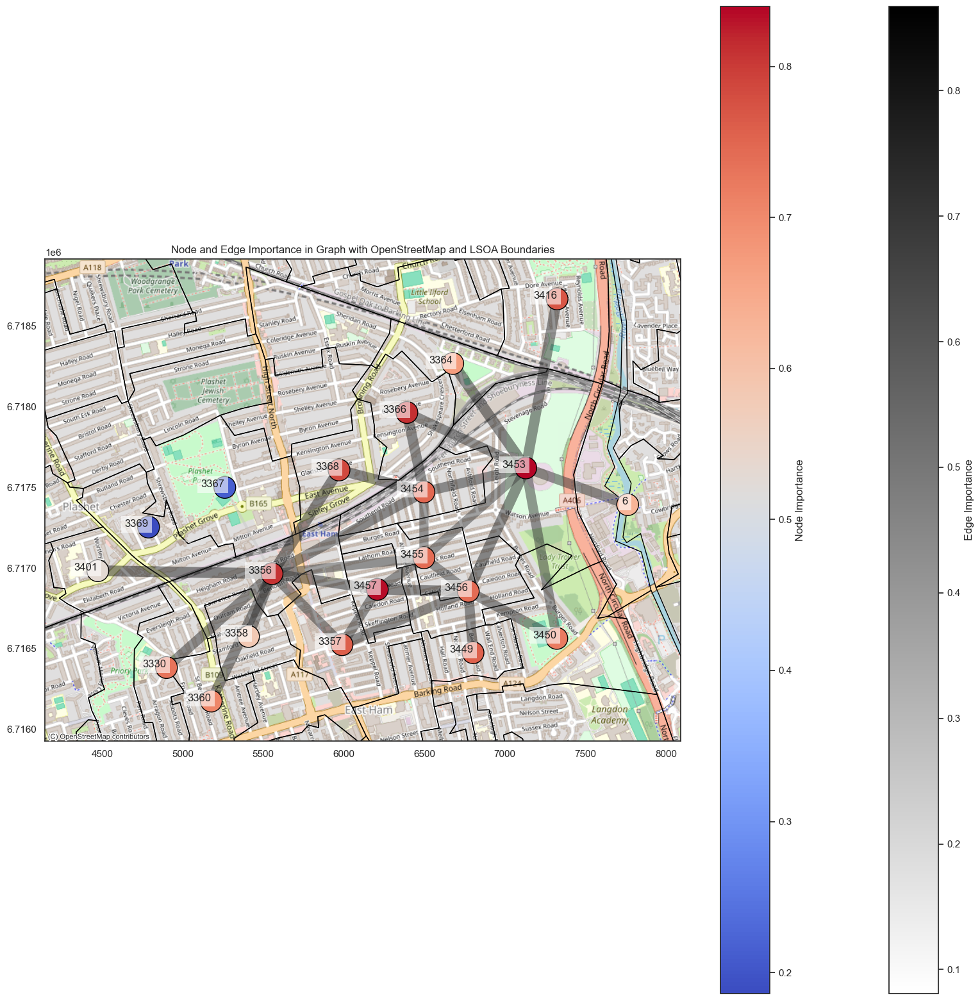

In [35]:
# 获取解释子图中的节点
node_indices = np.where(explanation.node_mask > 0)[0]
edge_indices = np.where(explanation.edge_mask > 0)[0]

# 获取节点的位置数据
node_positions = data.pos.numpy()

# 创建无向图
G = nx.Graph()

# 获取节点的重要性值
node_mask_values = {idx: explanation.node_mask[idx].item() for idx in node_indices}

# 添加解释子图中的节点和节点的重要性值作为属性
for idx in node_indices:
    value = explanation.node_mask[idx].item()
    lat, lon = node_positions[idx]
    G.add_node(int(idx), importance=value, pos=(lon, lat))

# 合成无向边并计算边的重要性
edge_importance = {}
for i in edge_indices:
    mask_value = explanation.edge_mask[i].item()
    source, target = data.edge_index[:, i]
    if source.item() in node_indices and target.item() in node_indices:  # 仅添加解释子图中的边
        if source.item() > target.item():  # 确保无向边的一致性
            source, target = target, source
        if (source.item(), target.item()) in edge_importance:
            edge_importance[(source.item(), target.item())].append(mask_value)
        else:
            edge_importance[(source.item(), target.item())] = [mask_value]

# 输出调试信息
print("Node indices:", node_indices)
print("Edge indices:", edge_indices)
print("Node positions:", {idx: (node_positions[idx][0], node_positions[idx][1]) for idx in node_indices})
print("Edge importance:", edge_importance)

# 计算每条无向边的重要性，对于只有一条有向边的情况直接使用该重要性值
edge_importance = {
    edge: np.mean(values) if len(values) > 1 else values[0] for edge, values in edge_importance.items()
}

# 添加边和边的重要性值作为属性
for (source, target), importance in edge_importance.items():
    G.add_edge(source, target, importance=importance)

# 获取节点位置
pos = nx.get_node_attributes(G, 'pos')

# 将节点位置转换为GeoDataFrame
geometry = [Point(lon, lat) for lat, lon in pos.values()]
node_importance = [G.nodes[node]['importance'] for node in G.nodes]
gdf = gpd.GeoDataFrame(list(pos.keys()), geometry=geometry, columns=['node'])
gdf['importance'] = node_importance

# 设置原始坐标系为EPSG:27700（英国国家格网）
gdf.set_crs(epsg=27700, inplace=True)
# 转换为WGS84坐标系（EPSG:4326）
gdf = gdf.to_crs(epsg=4326)
# 转换为墨卡托投影以匹配OpenStreetMap
gdf = gdf.to_crs(epsg=3857)

# 调试信息：检查转换后的坐标和边界框值
print("Converted coordinates:\n", gdf)
bounds = gdf.total_bounds  # 获取GeoDataFrame的边界框 [minx, miny, maxx, maxy]
print("Bounds:", bounds)

# 绘制图形
fig, ax = plt.subplots(figsize=(20, 20))

# 设置地图范围
if np.isfinite(bounds).all():
    x_buffer = (bounds[2] - bounds[0]) * 0.1
    y_buffer = (bounds[3] - bounds[1]) * 0.1
    ax.set_xlim([bounds[0] - x_buffer, bounds[2] + x_buffer])
    ax.set_ylim([bounds[1] - y_buffer, bounds[3] + y_buffer])
else:
    print("Invalid bounds detected, skipping axis limits setting")

# 添加OpenStreetMap底图
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# 绘制LSOA边界
London_lsoas_2021.boundary.plot(ax=ax, linewidth=1, edgecolor='black', zorder=2)

# 绘制GeoDataFrame并使用importance列作为颜色
gdf.plot(ax=ax, column='importance', cmap=plt.cm.coolwarm, markersize=600, edgecolor='black', zorder=5)

# 确保有边被添加到图中
if len(G.edges) > 0:
    # 绘制边，颜色和粗细根据重要性值进行调整
    for (source, target), importance in edge_importance.items():
        source_pos = gdf.loc[gdf['node'] == source, 'geometry'].values[0]
        target_pos = gdf.loc[gdf['node'] == target, 'geometry'].values[0]
        ax.plot([source_pos.x, target_pos.x], [source_pos.y, target_pos.y], 
                color=plt.cm.binary(importance), linewidth=14*importance, alpha=0.5, zorder=3)

    # 添加颜色条以显示边的重要性
    sm_edges = plt.cm.ScalarMappable(cmap=plt.cm.binary, norm=plt.Normalize(vmin=min(edge_importance.values()), vmax=max(edge_importance.values())))
    sm_edges._A = []
    plt.colorbar(sm_edges, ax=ax, label='Edge Importance')

# 添加节点的重要性颜色条
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=min(node_importance), vmax=max(node_importance)))
sm._A = []
plt.colorbar(sm, ax=ax, label='Node Importance')

# 添加节点标签
for node, (lat, lon) in pos.items():
    point = gpd.GeoSeries([Point(lon, lat)], crs="EPSG:27700").to_crs("EPSG:3857").geometry[0]
    ax.text(point.x, point.y, str(node), fontsize=12, ha='right', zorder=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))

plt.title("Node and Edge Importance in Graph with OpenStreetMap and LSOA Boundaries")
plt.show()

Center node: 3455
Node indices: [   6 3330 3356 3357 3358 3360 3364 3366 3367 3368 3369 3401 3416 3449
 3450 3453 3454 3455 3456 3457]
Direct neighbors: {3456, 3457, 3356, 3453, 3454}
Indirect neighbors: {3360, 3367, 3368, 3369, 3401, 3449, 3450, 3357, 3358}
WAD for center node 3455: 0.6534240779123808
Converted coordinates:
     node                      geometry  importance
0      6  POINT (7762.249 6717392.849)    0.629119
1   3330  POINT (4899.732 6716381.987)    0.730049
2   3356  POINT (5555.106 6716964.647)    0.807436
3   3357  POINT (5989.235 6716523.812)    0.758982
4   3358  POINT (5408.732 6716575.052)    0.582723
5   3360  POINT (5177.301 6716173.897)    0.704989
6   3364  POINT (6676.735 6718269.003)    0.668934
7   3366  POINT (6391.917 6717964.812)    0.810709
8   3367  POINT (5261.722 6717500.000)    0.213603
9   3368  POINT (5970.810 6717607.918)    0.785719
10  3369  POINT (4788.541 6717253.748)    0.186038
11  3401  POINT (4473.541 6716982.910)    0.528387
12  3416 

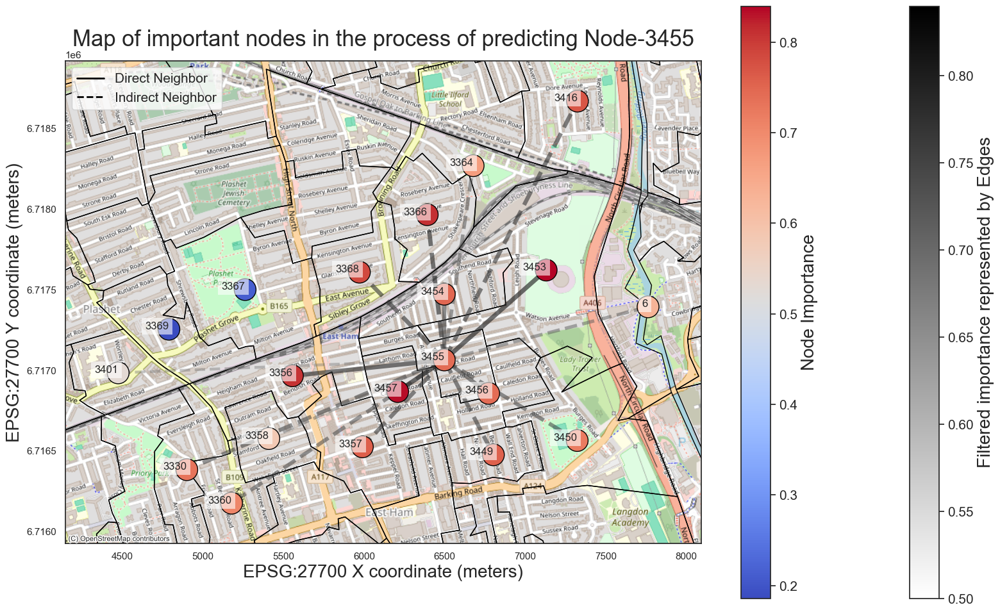

In [38]:
import numpy as np
import networkx as nx
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.lines import Line2D

# 假设研究中心节点为2428
center_node = 3455
threshold = 0.5

# 初始化直接邻居和间接邻居集合
direct_neighbors = set()
indirect_neighbors = set()

# 输出用于调试的信息
print(f"Center node: {center_node}")
print(f"Node indices: {node_indices}")

# 遍历 node_indices 找出直接邻居和间接邻居
for i in range(data.edge_index.shape[1]):
    source, target = data.edge_index[:, i]
    source, target = source.item(), target.item()
    if source in node_indices and target in node_indices:
        if source == center_node:
            direct_neighbors.add(target)
        elif target == center_node:
            direct_neighbors.add(source)
        elif source in direct_neighbors:
            indirect_neighbors.add(target)
        elif target in direct_neighbors:
            indirect_neighbors.add(source)

# 移除直接邻居中出现的间接邻居
indirect_neighbors -= direct_neighbors

# 输出直接邻居和间接邻居集合
print(f"Direct neighbors: {direct_neighbors}")
print(f"Indirect neighbors: {indirect_neighbors}")

# 构建新的边索引
new_edge_importance = {}
for node in node_indices:
    if node == center_node:
        continue
    importance = explanation.node_mask[node].item()
    new_edge_importance[(center_node, node)] = importance

# 计算WAD
edge_importances_for_wad = []
for (source, target), importance in new_edge_importance.items():
    if target in indirect_neighbors and importance < threshold:
        edge_importances_for_wad.append(0)  # 将重要性<threshold 的间接邻居边的值视为0
    else:
        edge_importances_for_wad.append(importance)

if edge_importances_for_wad:
    WAD = np.mean(edge_importances_for_wad)
else:
    WAD = 0

print(f"WAD for center node {center_node}: {WAD}")

# 创建无向图
G = nx.Graph()

# 添加节点和边到图中，并赋予默认的重要性值
for idx in node_indices:
    value = explanation.node_mask[idx].item()
    lat, lon = node_positions[idx]
    G.add_node(int(idx), importance=value, pos=(lon, lat))

for (source, target), importance in new_edge_importance.items():
    G.add_edge(source, target, importance=importance)

# 获取节点位置
pos = nx.get_node_attributes(G, 'pos')

# 将节点位置转换为GeoDataFrame
geometry = [Point(lon, lat) for lat, lon in pos.values()]
node_importance = [G.nodes[node]['importance'] for node in G.nodes]
gdf = gpd.GeoDataFrame(list(pos.keys()), geometry=geometry, columns=['node'])
gdf['importance'] = node_importance

# 设置原始坐标系为EPSG:27700（英国国家格网）
gdf.set_crs(epsg=27700, inplace=True)
# 转换为WGS84坐标系（EPSG:4326）
gdf = gdf.to_crs(epsg=4326)
# 转换为墨卡托投影以匹配OpenStreetMap
gdf = gdf.to_crs(epsg=3857)

# 调试信息：检查转换后的坐标和边界框值
print("Converted coordinates:\n", gdf)
bounds = gdf.total_bounds  # 获取GeoDataFrame的边界框 [minx, miny, maxx, maxy]
print("Bounds:", bounds)

# 绘制图形
fig, ax = plt.subplots(figsize=(20, 20))

# 设置地图范围
if np.isfinite(bounds).all():
    x_buffer = (bounds[2] - bounds[0]) * 0.1
    y_buffer = (bounds[3] - bounds[1]) * 0.1
    ax.set_xlim([bounds[0] - x_buffer, bounds[2] + x_buffer])
    ax.set_ylim([bounds[1] - y_buffer, bounds[3] + y_buffer])
else:
    print("Invalid bounds detected, skipping axis limits setting")

# 添加OpenStreetMap底图
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# 绘制LSOA边界
London_lsoas_2021.boundary.plot(ax=ax, linewidth=1, edgecolor='black', zorder=2)

# 绘制GeoDataFrame并使用importance列作为颜色
gdf.plot(ax=ax, column='importance', cmap=plt.cm.coolwarm, markersize=600, edgecolor='black', zorder=5)

# 确保有边被添加到图中
if len(G.edges) > 0:
    # 绘制边，颜色和粗细根据重要性值进行调整
    for (source, target), importance in new_edge_importance.items():
        source_pos = gdf.loc[gdf['node'] == source, 'geometry'].values[0]
        target_pos = gdf.loc[gdf['node'] == target, 'geometry'].values[0]
        linestyle = 'solid' if target in direct_neighbors or source in direct_neighbors else 'dashed'
        alpha = 0.8 if linestyle == 'solid' or importance > threshold else threshold
        if alpha > threshold:
            ax.plot([source_pos.x, target_pos.x], [source_pos.y, target_pos.y], 
                    color=plt.cm.binary(importance), linewidth=6*importance, alpha=importance*0.8, linestyle=linestyle, zorder=3)

    # 添加颜色条以显示边的重要性
    sm_edges = plt.cm.ScalarMappable(cmap=plt.cm.binary, norm=plt.Normalize(vmin=threshold, vmax=max(new_edge_importance.values())))
    sm_edges._A = []
    cbar_edges = plt.colorbar(sm_edges, ax=ax, label='Filtered importance represented by Edges', shrink=0.6)
    cbar_edges.ax.tick_params(labelsize=15)
    cbar_edges.set_label('Filtered importance represented by Edges', fontsize=20)

# 添加节点的重要性颜色条
sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=min(node_importance), vmax=max(node_importance)))
sm._A = []
cbar = plt.colorbar(sm, ax=ax, label='Node Importance', shrink=0.6)
cbar.ax.tick_params(labelsize=15)
cbar.set_label('Node Importance', fontsize=20)

# 添加节点标签
for node, (lat, lon) in pos.items():
    point = gpd.GeoSeries([Point(lon, lat)], crs="EPSG:27700").to_crs("EPSG:3857").geometry[0]
    ax.text(point.x, point.y, str(node), fontsize=12, ha='right', zorder=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))

# 设置坐标轴标签和标题
ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=20)
ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=20)
plt.title("Map of important nodes in the process of predicting Node-3455", fontsize=25)

# 添加图例
legend_elements = [
    Line2D([0], [0], color='black', lw=2, linestyle='solid', label='Direct Neighbor'),
    Line2D([0], [0], color='black', lw=2, linestyle='dashed', label='Indirect Neighbor')
]
ax.legend(handles=legend_elements, fontsize=15, loc='upper left')
# Ensure the output folder exists
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# Save the plot to the output folder
output_path = os.path.join(output_folder, '3455解释图.png')
plt.savefig(output_path)

plt.show()


['e_NO2']


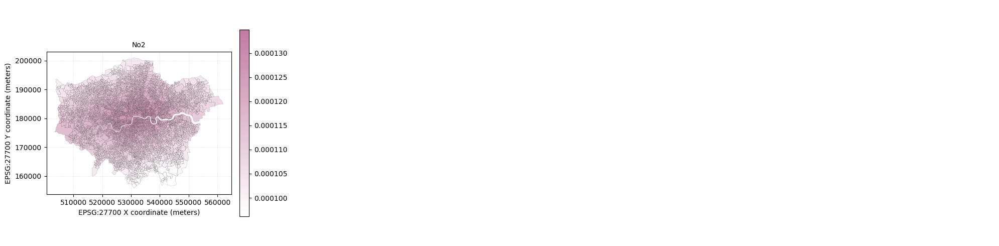

In [23]:
import os
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.patches import Patch

def plot_variable_v2(ax, gdf, variable, variable_name):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    else:
        colormap = 'coolwarm'

    # Plotting the GeoPandas DataFrame without legend
    gdf.plot(column=variable, ax=ax, cmap=colormap,
             edgecolor='black', linewidth=0.1, alpha=0.8)

    # Add grid and set transparency
    ax.grid(True, linestyle='--', linewidth=0.4, alpha=0.4)

    # Title
    ax.set_title(variable_name, fontsize=10)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=10)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=10)

    # Create colorbar manually
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=gdf[variable].min(), vmax=gdf[variable].max()))
    sm._A = []
    cax = ax.figure.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cax.ax.tick_params(labelsize=10)

# 提取所有以 'e_NO2' 开头的变量
environmental_variables = [col for col in gdf.columns if col.startswith('e_NO2')]

print(environmental_variables)
# 设置子图的布局
num_vars = len(environmental_variables)
num_cols = 4  # 每行显示的子图数
num_rows = (num_vars + num_cols - 1) // num_cols  # 计算需要多少行

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# 绘制所有环境变量
for i, variable in enumerate(environmental_variables):
    variable_name = variable.replace('e_', '').replace('_', ' ').title()
    plot_variable_v2(axes[i], gdf, variable, variable_name)

# 隐藏多余的子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()

# Ensure the output folder exists
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# Save the plot to the output folder
output_path = os.path.join(output_folder, 'PCA结果.png')
plt.savefig(output_path)

plt.show()

In [ ]:
# 确保目标文件夹存在
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# 保存图片到目标文件夹
output_path = os.path.join(output_folder, 'Two-layer Adjacency Network.png')
plt.savefig(output_path)

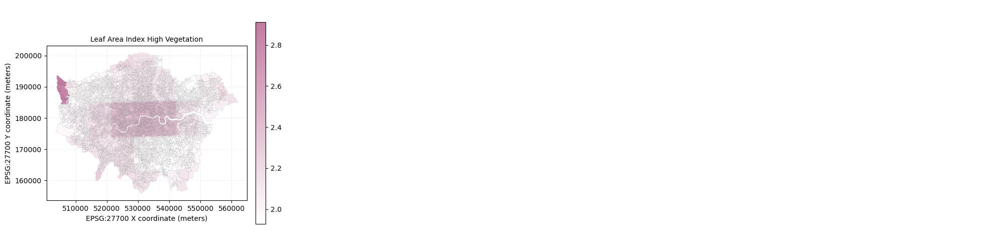

In [31]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from shapely import wkt
from matplotlib.patches import Patch
import os

def plot_variable_v2(ax, gdf, variable, variable_name, add_missing_legend=False):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    elif variable.startswith('o'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#6d9eeb'])
    else:
        colormap = 'coolwarm'

    # Parameters to display missing data in black
    missing_data_color = 'black'

    # Plotting the GeoPandas DataFrame without legend
    gdf.plot(column=variable, ax=ax, cmap=colormap,
             edgecolor='black', linewidth=0.05, alpha=1,  # 设置边界线的粗细和透明度
             missing_kwds={'color': missing_data_color, 'label': 'Missing Data'})

    # Add grid and set transparency
    ax.grid(True, linestyle='--', linewidth=0.4, alpha=0.4)

    # Title
    ax.set_title(variable_name, fontsize=10)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=10)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=10)

    # Create colorbar manually
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=gdf[variable].min(), vmax=gdf[variable].max()))
    sm._A = []
    cax = ax.figure.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cax.ax.tick_params(labelsize=10)

    # Add legend for missing data if needed
    if add_missing_legend:
        missing_patch = Patch(facecolor=missing_data_color, edgecolor='black', label='Missing Data Area')
        ax.legend(handles=[missing_patch], fontsize=10, loc='upper right')

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 提取所有以 'c_' 开头的变量
c_variables = [col for col in gdf.columns if col.startswith('e_leaf_area_index_high_vegetation')]

# 设置子图的布局
num_vars = len(c_variables)
num_cols = 4  # 每行显示的子图数
num_rows = (num_vars + num_cols - 1) // num_cols  # 计算需要多少行

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# 绘制所有 'c_' 变量
for i, variable in enumerate(c_variables):
    #variable_name = variable.replace('c_', '').replace('_', ' ').title()
    variable_name = variable.replace('e_', '').replace('_', ' ').title()
    add_missing_legend = gdf[variable].isna().any()
    plot_variable_v2(axes[i], gdf, variable, variable_name, add_missing_legend)

# 隐藏多余的子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()

# Ensure the output folder exists
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# Save the plot to the output folder
output_path = os.path.join(output_folder, '环境变量.png')
plt.savefig(output_path)

plt.show()

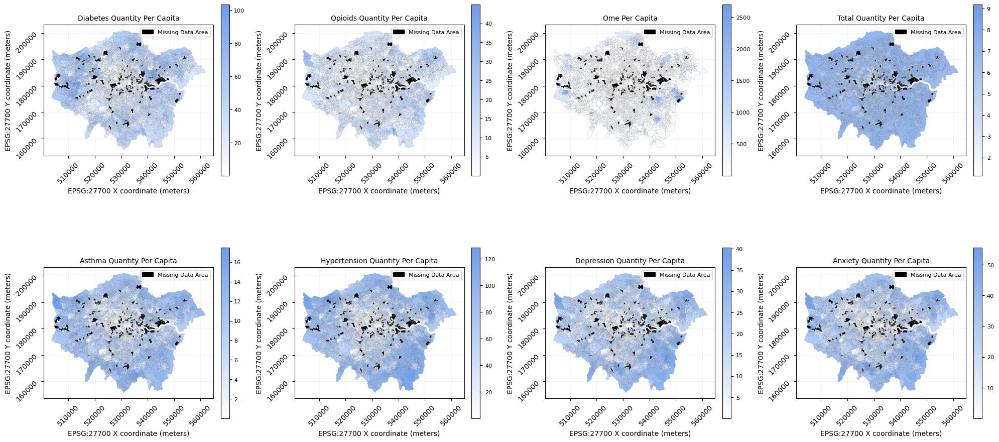

In [48]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from shapely import wkt
from matplotlib.patches import Patch
import os

def wrap_text(text, width):
    """
    Wrap text to a specified width.
    """
    return '\n'.join([text[i:i+width] for i in range(0, len(text), width)])

def plot_variable_v2(ax, gdf, variable, variable_name, add_missing_legend=False):
    if variable.startswith('e'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#c27ba0'])
    elif variable.startswith('c'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#008080'])
    elif variable.startswith('o'):
        colormap = colors.LinearSegmentedColormap.from_list('', ['#ffffff', '#6d9eeb'])
    else:
        colormap = 'coolwarm'

    # Parameters to display missing data in black
    missing_data_color = 'black'

    # Plotting the GeoPandas DataFrame without legend
    gdf.plot(column=variable, ax=ax, cmap=colormap,
             edgecolor='black', linewidth=0.05, alpha=1,  # 设置边界线的粗细和透明度
             missing_kwds={'color': missing_data_color, 'label': 'Missing Data'})

    # Add grid and set transparency
    ax.grid(True, linestyle='--', linewidth=0.4, alpha=0.4)

    # Truncate and wrap the title if it's too long
    max_title_length = 80
    if len(variable_name) > max_title_length:
        variable_name = wrap_text(variable_name, max_title_length // 2)

    # Title
    ax.set_title(variable_name, fontsize=10)

    # Set axis labels and units
    ax.set_xlabel('EPSG:27700 X coordinate (meters)', fontsize=10)
    ax.set_ylabel('EPSG:27700 Y coordinate (meters)', fontsize=10)

    # Adjust tick parameters
    ax.tick_params(axis='both', which='major', labelsize=10, rotation=45)

    # Create colorbar manually
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=gdf[variable].min(), vmax=gdf[variable].max()))
    sm._A = []
    cax = ax.figure.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cax.ax.tick_params(labelsize=8)

    # Add legend for missing data if needed
    if add_missing_legend:
        missing_patch = Patch(facecolor=missing_data_color, edgecolor='black', label='Missing Data Area')
        ax.legend(handles=[missing_patch], fontsize=8, loc='upper right')

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 设置坐标系 (假设是EPSG:27700坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 提取所有以 'e_' 开头的变量
c_variables = [col for col in gdf.columns if col.startswith('o_')]

# 设置子图的布局
num_vars = len(c_variables)
num_cols = 4  # 每行显示的子图数
num_rows = (num_vars + num_cols - 1) // num_cols  # 计算需要多少行

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# 绘制所有 'c_' 变量
for i, variable in enumerate(c_variables):
    variable_name = variable.replace('o_', '').replace('_', ' ').title()
    # variable_name = variable.replace('e_', '').replace('_', ' ').title()
    add_missing_legend = gdf[variable].isna().any()
    plot_variable_v2(axes[i], gdf, variable, variable_name, add_missing_legend)

# 隐藏多余的子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()

# Ensure the output folder exists
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# Save the plot to the output folder
output_path = os.path.join(output_folder, '处方变量.png')
plt.savefig(output_path, bbox_inches='tight')

plt.show()

In [8]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

# Read the CSV file
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# Convert the 'geometry' column to Shapely geometry objects
df['geometry'] = df['geometry'].apply(wkt.loads)

# Create the GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# 提取所有以 'e_' 和 'c_' 开头的变量
variables = [col for col in gdf.columns if col.startswith('e_') or col.startswith('c_')]

# 处理变量名
processed_variable_names = [var.replace('e_', '').replace('c_', '').replace('_', ' ').title() for var in variables]

# 生成编码字典
variable_codes = {var: f'{i+1}' for i, var in enumerate(processed_variable_names)}

# 创建编码和变量名的DataFrame
code_name_df = pd.DataFrame(list(variable_codes.items()), columns=['Variable Name', 'Code'])

# 输出编码对应变量名的表格
print(code_name_df)

# 保存编码表格到CSV文件
code_name_df.to_csv('variable_codes.csv', index=False)


       Variable Name Code
0      Percent Asian    1
1      Percent Black    2
2      Percent Mixed    3
3      Percent White    4
4       Percent Sikh    5
..               ...  ...
150            Crops  151
151  Shrub And Scrub  152
152            Built  153
153             Bare  154
154     Snow And Ice  155

[155 rows x 2 columns]


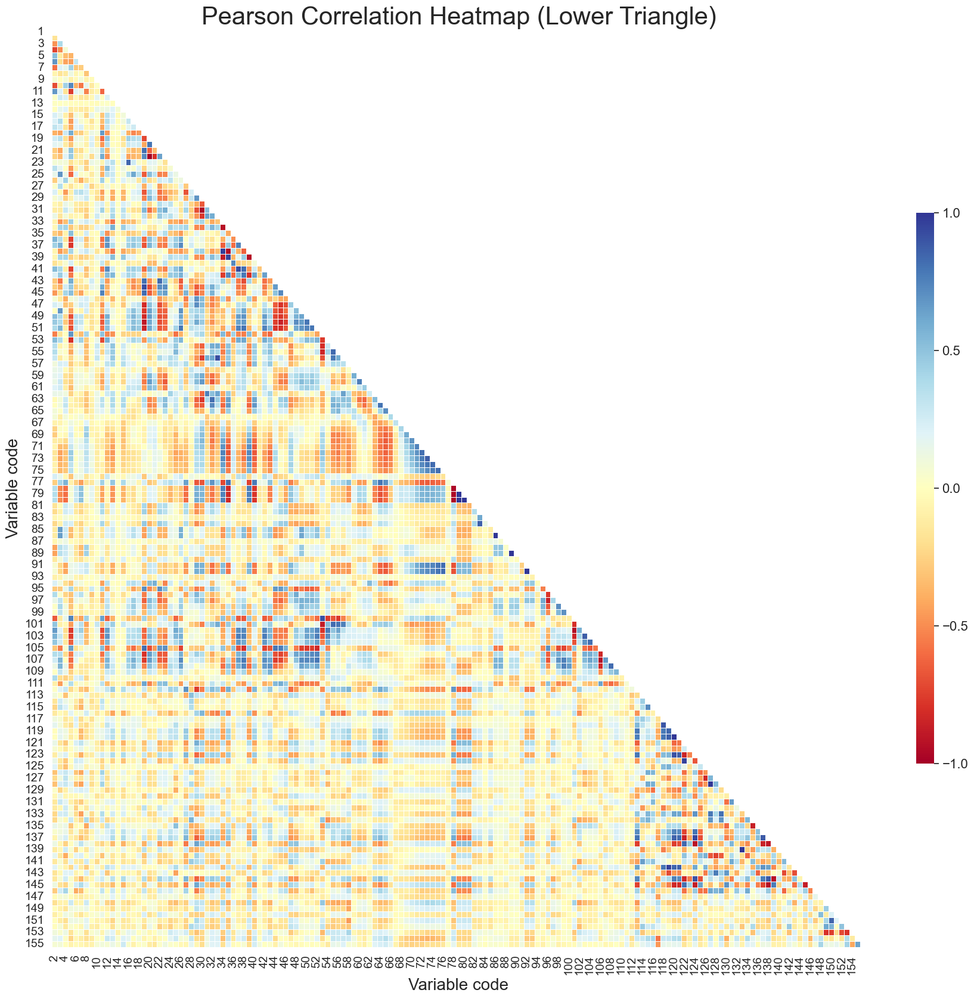

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os

# 计算皮尔逊相关系数
correlation_matrix = gdf[variables].corr(method='pearson')

# 创建一个掩码来显示热图的下三角
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# 设置绘图风格
sns.set(style='white')

# 绘制热图的下三角
plt.figure(figsize=(22, 20))  # 增加图表大小
heatmap = sns.heatmap(correlation_matrix, mask=mask, annot=False, cmap='RdYlBu', 
                      linewidths=0.5, cbar_kws={"shrink": .6, "aspect": 30, "ticks": np.arange(-1, 1.1, 0.5)}, vmin=-1, vmax=1)

# 获取 color bar 对象并调整字体大小
colorbar = heatmap.collections[0].colorbar
colorbar.ax.tick_params(labelsize=16)  # 调整色条 tick 字体大小

# 设置坐标轴标签
codes = [variable_codes[var] for var in processed_variable_names]

# 设置 y 轴标签为 1, 3, 5, ...
heatmap.set_yticks(np.arange(0.5, len(variables), 2))
heatmap.set_yticklabels([codes[i] for i in range(0, len(codes), 2)], fontsize=14)

# 设置 x 轴标签为 2, 4, 6, ...
heatmap.set_xticks(np.arange(1.5, len(variables), 2))
heatmap.set_xticklabels([codes[i] for i in range(1, len(codes), 2)], rotation=90, fontsize=14, ha='right')

# 添加坐标轴名称
heatmap.set_xlabel('Variable code', fontsize=20)
heatmap.set_ylabel('Variable code', fontsize=20)
plt.title('Pearson Correlation Heatmap (Lower Triangle)', fontsize=30)

# 确保输出文件夹存在
output_folder = '论文出图'
os.makedirs(output_folder, exist_ok=True)

# 保存绘图到输出文件夹
output_path = os.path.join(output_folder, '相关系数矩阵.png')
plt.savefig(output_path, bbox_inches='tight')

plt.show()


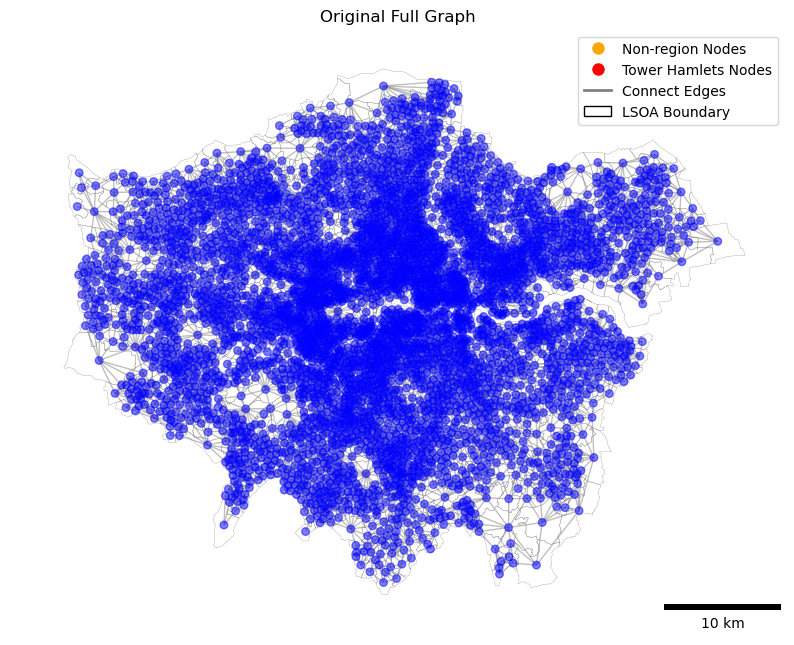

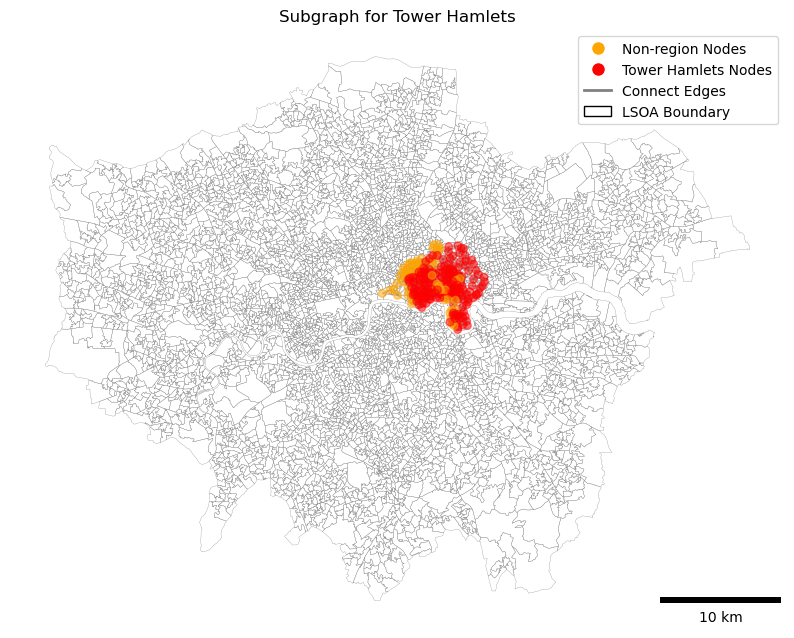

In [267]:
import os
import pandas as pd
import geopandas as gpd
from shapely import wkt
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib_scalebar.scalebar as sb
import torch
from torch_geometric.utils import k_hop_subgraph
from torch_geometric.utils import from_networkx

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
for idx, row in neighbors.iterrows():
    G.add_edge(row.name, row['index_right'], weight=1)

# 将 NetworkX 图转换为 PyTorch Geometric 数据
data = from_networkx(G)

# 定义创建子图的函数，包括边界节点
def create_subgraph(data, nodes, num_hops=2):
    subgraph_nodes, subgraph_edge_index, _, _ = k_hop_subgraph(nodes, num_hops, data.edge_index, relabel_nodes=True)
    subgraph_pos = {i: (gdf.at[node_id, 'geo_centroid'].x, gdf.at[node_id, 'geo_centroid'].y) for i, node_id in enumerate(subgraph_nodes.cpu().numpy())}
    return subgraph_nodes, subgraph_edge_index, subgraph_pos

# 绘制图的函数，结合你的绘图风格
def plot_graph(gdf, edge_index, pos, title, node_colors, region_nodes=None):
    fig, ax = plt.subplots(figsize=(10, 10))

    # 绘制地理坐标边框，并设置透明度
    gdf.boundary.plot(ax=ax, linewidth=0.2, edgecolor='gray')

    # 绘制节点和边
    G = nx.Graph()
    G.add_edges_from(edge_index.cpu().numpy().T)
    
    # 绘制图形
    nx.draw(G, pos, node_size=30, node_color=node_colors, edge_color='grey', alpha=0.5, ax=ax)

    # 添加比例尺
    scalebar = sb.ScaleBar(1, location='lower right')
    ax.add_artist(scalebar)

    # 创建自定义图例
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Non-region Nodes',
               markerfacecolor='orange', markersize=10),
        Line2D([0], [0], marker='o', color='w', label=f'{region_name} Nodes',
               markerfacecolor='red', markersize=10),
        Line2D([0], [0], color='grey', lw=2, label='Connect Edges'),
        Patch(facecolor='none', edgecolor='black', label='LSOA Boundary')
    ]

    # 添加图例到图中
    ax.legend(handles=legend_elements, loc='upper right')

    plt.title(title)
    plt.show()

# 获取测试集子图
region_name = 'Tower Hamlets'
region_mask = gdf['LSOA21NM'].str.contains(region_name)

# 将 region_mask 转换为 PyTorch Tensor
region_mask_tensor = torch.tensor(region_mask.values, dtype=torch.bool)
test_idx = torch.where(region_mask_tensor)[0]

# 获取子图的节点和边
subgraph_nodes, subgraph_edge_index, subgraph_pos = create_subgraph(data, test_idx)

# 获取完整图的节点的几何中心点坐标
full_pos = nx.get_node_attributes(G, 'pos')

# 为子图的节点设置颜色：'Tower Hamlets' 内的节点为红色，其他邻居节点为橙色
node_colors = []
for node in subgraph_nodes.cpu().numpy():
    if node in test_idx.cpu().numpy():
        node_colors.append('red')
    else:
        node_colors.append('orange')

# 绘制完整原图
plot_graph(gdf, data.edge_index, full_pos, title="Original Full Graph", node_colors=['blue'] * len(full_pos))

# 绘制测试集子图
plot_graph(gdf, subgraph_edge_index, subgraph_pos, title=f"Subgraph for {region_name}", node_colors=node_colors)


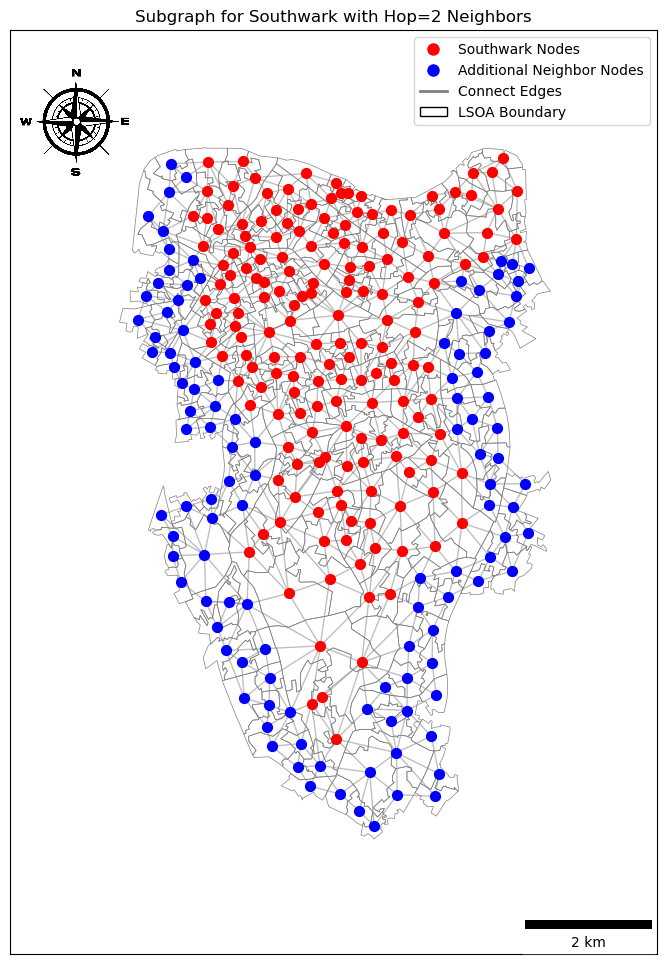

In [262]:
import os
import pandas as pd
import geopandas as gpd
from shapely import wkt
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib_scalebar.scalebar as sb
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import torch
from torch_geometric.utils import k_hop_subgraph
from torch_geometric.utils import from_networkx

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
for idx, row in neighbors.iterrows():
    G.add_edge(row.name, row['index_right'], weight=1)

# 将 NetworkX 图转换为 PyTorch Geometric 数据
data = from_networkx(G)

# 获取 Southwark 区域的节点
region_name_southwark = 'Southwark'
region_mask_southwark = gdf['LSOA21NM'].str.contains(region_name_southwark)

# 将 region_mask_southwark 转换为 PyTorch Tensor
region_mask_tensor_southwark = torch.tensor(region_mask_southwark.values, dtype=torch.bool)
southwark_idx = torch.where(region_mask_tensor_southwark)[0]

# 找出hop=2的子图
subgraph_nodes, subgraph_edge_index, _, _ = k_hop_subgraph(southwark_idx, 2, data.edge_index, relabel_nodes=True)
subgraph_nodes = subgraph_nodes.cpu().numpy()

# 确定哪些节点是Southwark区域的，哪些是邻居
southwark_nodes_set = set(southwark_idx.cpu().numpy())
subgraph_pos = {i: (gdf.at[node_id, 'geo_centroid'].x, gdf.at[node_id, 'geo_centroid'].y) for i, node_id in enumerate(subgraph_nodes)}

southwark_nodes_in_subgraph = [i for i in range(len(subgraph_nodes)) if subgraph_nodes[i] in southwark_nodes_set]
neighbor_nodes_in_subgraph = [i for i in range(len(subgraph_nodes)) if subgraph_nodes[i] not in southwark_nodes_set]

# 只选择子图集合中的LSOA边界
subgraph_gdf = gdf.loc[subgraph_nodes]

# 绘制图的函数，结合你的绘图风格
def plot_colored_subgraph(subgraph_gdf, edge_index, pos, title, southwark_nodes, neighbor_nodes):
    fig, ax = plt.subplots(figsize=(12, 12))  # 增大绘图区域的尺寸

    # 绘制子图集合中的LSOA边界
    subgraph_gdf.boundary.plot(ax=ax, linewidth=0.5, edgecolor='gray')

    # 绘制子图
    G = nx.Graph()
    G.add_edges_from(edge_index.cpu().numpy().T)
    
    nx.draw_networkx_nodes(G, pos, nodelist=southwark_nodes, node_size=50, node_color='red', ax=ax)
    nx.draw_networkx_nodes(G, pos, nodelist=neighbor_nodes, node_size=50, node_color='blue', ax=ax)
    nx.draw_networkx_edges(G, pos, edgelist=G.edges, edge_color='grey', alpha=0.5, ax=ax)

    # 调整绘制区域限制，缩小显示内容以留出空白区域
    x_values = [x for x, y in pos.values()]
    y_values = [y for x, y in pos.values()]
    ax.set_xlim(min(x_values) - 2000, max(x_values) + 2000)
    ax.set_ylim(min(y_values) - 2000, max(y_values) + 2000)

    # 添加比例尺
    scalebar = sb.ScaleBar(1, location='lower right')
    ax.add_artist(scalebar)

    # 添加指北针
    arr_img = plt.imread("north arrow.png")  # 替换为你的指北针图片路径
    imagebox = OffsetImage(arr_img, zoom=0.08)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.9), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # 创建自定义图例
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Southwark Nodes',
               markerfacecolor='red', markersize=10),
        Line2D([0], [0], marker='o', color='w', label='Additional Neighbor Nodes',
               markerfacecolor='blue', markersize=10),
        Line2D([0], [0], color='grey', lw=2, label='Connect Edges'),
        Patch(facecolor='none', edgecolor='black', label='LSOA Boundary')
    ]

    # 将图例放置在图的右上角
    ax.legend(handles=legend_elements, loc='upper right')

    plt.title(title)
    plt.show()

# 绘制 Southwark 区域及其邻居的子图
plot_colored_subgraph(subgraph_gdf, subgraph_edge_index, subgraph_pos, title=f"Subgraph for {region_name_southwark} with Hop=2 Neighbors", 
                      southwark_nodes=southwark_nodes_in_subgraph, 
                      neighbor_nodes=neighbor_nodes_in_subgraph)


In [1]:
import os
import pandas as pd
import geopandas as gpd
from shapely import wkt
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib_scalebar.scalebar as sb
import torch
from torch_geometric.utils import from_networkx

# 读取CSV文件并创建GeoDataFrame
csv_file = 'LondonLSOAs.csv'
df = pd.read_csv(csv_file)

# 创建几何对象（假设geometry列包含WKT格式的多边形数据）
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df['geometry']))

# 设置坐标系 (假设是WGS84坐标系)
gdf.set_crs(epsg=27700, inplace=True)

# 计算每个LSOA的几何中心点
gdf['geo_centroid'] = gdf.centroid

# 计算相邻关系
neighbors = gpd.sjoin(gdf, gdf, how='left', predicate='intersects')
neighbors = neighbors[neighbors.index != neighbors.index_right]

# 构建邻接矩阵
G = nx.Graph()

# 添加节点
for idx, row in gdf.iterrows():
    G.add_node(idx, pos=(row.geo_centroid.x, row.geo_centroid.y))

# 添加边，根据相邻关系
for idx, row in neighbors.iterrows():
    G.add_edge(row.name, row['index_right'], weight=1)

# 将 NetworkX 图转换为 PyTorch Geometric 数据
data = from_networkx(G)

# 获取 Southwark 区域的节点
region_name_southwark = 'Southwark'
region_mask_southwark = gdf['LSOA21NM'].str.contains(region_name_southwark)

# 将 region_mask_southwark 转换为 PyTorch Tensor
region_mask_tensor_southwark = torch.tensor(region_mask_southwark.values, dtype=torch.bool)
southwark_idx = torch.where(region_mask_tensor_southwark)[0]

# 从原始数据中移除 Southwark 区域的节点
remaining_nodes = torch.tensor(list(set(range(data.num_nodes)) - set(southwark_idx.tolist())), dtype=torch.long)

# 创建新的图，移除 Southwark 节点
mask = (data.edge_index[0].unsqueeze(1) == remaining_nodes).any(dim=1) & (data.edge_index[1].unsqueeze(1) == remaining_nodes).any(dim=1)
remaining_edge_index = data.edge_index[:, mask]

# 获取保留节点的坐标
remaining_pos = {i: pos for i, pos in nx.get_node_attributes(G, 'pos').items() if i in remaining_nodes.tolist()}

# 绘制拆分 Southwark 节点后的原始图并高亮 Southwark 区域的边界
def plot_original_graph_after_removal_with_highlight(gdf, edge_index, pos, southwark_gdf, title):
    fig, ax = plt.subplots(figsize=(12, 12))

    # 绘制剩余的LSOA边界
    gdf.boundary.plot(ax=ax, linewidth=0.5, edgecolor='gray')

    # 高亮显示 Southwark 区域的边界
    southwark_gdf.boundary.plot(ax=ax, linewidth=1, edgecolor='red',alpha=0.5)

    # 绘制剩余的节点和边
    G = nx.Graph()
    G.add_edges_from(edge_index.cpu().numpy().T)
    
    nx.draw(G, pos, node_size=4, node_color='blue', edge_color='grey', alpha=0.5, ax=ax)

    # 调整绘制区域限制，缩小显示内容以留出空白区域
    x_values = [x for x, y in pos.values()]
    y_values = [y for x, y in pos.values()]
    ax.set_xlim(min(x_values) - 2000, max(x_values) + 2000)
    ax.set_ylim(min(y_values) - 2000, max(y_values) + 2000)

    # 添加比例尺
    scalebar = sb.ScaleBar(1, location='lower right')
    ax.add_artist(scalebar)

    # 添加指北针
    arr_img = plt.imread("north arrow.png")  # 替换为你的指北针图片路径
    imagebox = OffsetImage(arr_img, zoom=0.08)  # 调整缩放比例
    ab = AnnotationBbox(imagebox, (0.1, 0.9), frameon=False, xycoords='axes fraction')
    ax.add_artist(ab)

    # 创建自定义图例
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Remaining Nodes',
               markerfacecolor='black', markersize=10),
        Line2D([0], [0], color='grey', lw=2, label='Connect Edges'),
        Patch(facecolor='none', edgecolor='red', label='Southwark Boundary'),
         Patch(facecolor='none', edgecolor='black', label='Other LSOA Boundary')
    ]

    # 将图例放置在图的右上角
    ax.legend(handles=legend_elements, loc='upper right')

    plt.title(title)
    plt.show()

# 提取 Southwark 区域的边界
southwark_gdf = gdf.loc[southwark_idx.numpy()]

# 绘制带有 Southwark 区域高亮显示的拆分后的原始图
plot_original_graph_after_removal_with_highlight(gdf, remaining_edge_index, remaining_pos, southwark_gdf, title="Original Graph After Southwark Subgraph Removed")


ModuleNotFoundError: No module named 'matplotlib.scalebar'